__This notebook applies the same functions as the 02_autoencoder notebook. But instead of correlating all single activations with neuron spikes here whole activation maps are correlated with neural spikes.__

In [ ]:
import sys
import csv
import math
import os.path
import numpy as np
import matplotlib.pyplot as plt

from operator import attrgetter
from operator import itemgetter

from bee_view_analyzer.ModelLoader import *
import bee_view_analyzer.Autoencoder as Autoencoder
import bee_view_analyzer.Correlation as Correlation
import bee_view_analyzer.DataLoader as DataLoader
import bee_view_analyzer.Utils as Utils
import bee_view_analyzer.Visualizer as Visualizer
import bee_view_analyzer.DistributionTest as DistributionTest
import bee_view_analyzer.Helper as Helper

# Preparation

In [ ]:
model_path = Utils.get_path(['02_autoencoder'], 'model.pt')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 128
    
h, w = 262 // 4.05, 226 // 4.05
h = int(h)
w = int(w)


bee_view_image_path = Utils.get_path(["flights", "flight_2018_09_03#1", "bee_eye"])

model_loader = ModelLoader(Autoencoder, model_path, bee_view_image_path, batch_size = batch_size,
                           image_height = h, image_width = w)

In [ ]:
start_round_frames = [630, 2900, 4580]
end_round_frames = [2120, 4370, 6050]

start_flight_lines_round_1 = [630, 1190, 1570, 1921]
end_flight_lines_round_1 = [1034, 1385, 1720, 2117]

start_flight_lines_round_2 = [2900, 3462, 3786, 4183]
end_flight_lines_round_2 = [3300, 3651, 3979, 4368]

start_flight_lines_round_3 = [4580, 5135, 5481, 5866]
end_flight_lines_round_3 = [4981, 5327, 5646, 6050]

highlight = [start_round_frames[0], end_round_frames[0],
             start_round_frames[1], end_round_frames[1],
             start_round_frames[2], end_round_frames[2]]

In [ ]:
csv_file_path = Utils.get_path(['flights', 'flight_2018_09_03#1'],
                              '030918_01_out_adc_synced.csv_spike_rates_0.1s_intervalls.csv')

neuro_spikes = DataLoader.load_neuro_data(model_loader, csv_file_path, spike_type_row = 8, start_frame = 600)

In [ ]:
def evaluate(activations, neuro_data):
    print("Global correlation:")
    Helper.global_hist(activations, neuro_data)
    
    print("Correlation per round:")
    Helper.round_hists(activations, neuro_data, start_round_frames, end_round_frames)
        
    window_size = 20
    patterns = Helper.get_distributions(activations, neuro_data, window_size,
                                        start_round_frames[0], end_round_frames[0], start_round_frames,
                                        exclude_start_frame_num=0)
        
    Helper.print_best_distributions(patterns, activations, neuro_data, highlight=highlight)
    
    
def get_derived_neuro_spikes():
    neuro_spikes_prime = [neuro_spikes[0]]

    for i in range(1, len(neuro_spikes)):
        neuro_spikes_prime.append(neuro_spikes[i] - neuro_spikes[i - 1])
        
    return neuro_spikes_prime

# Correlate filters with neuro data (sum(abs))

In [ ]:
activations_abs = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.sum_abs)

## Global analysis

In [ ]:
corrs = Correlation.correlate(activations_abs, neuro_spikes)

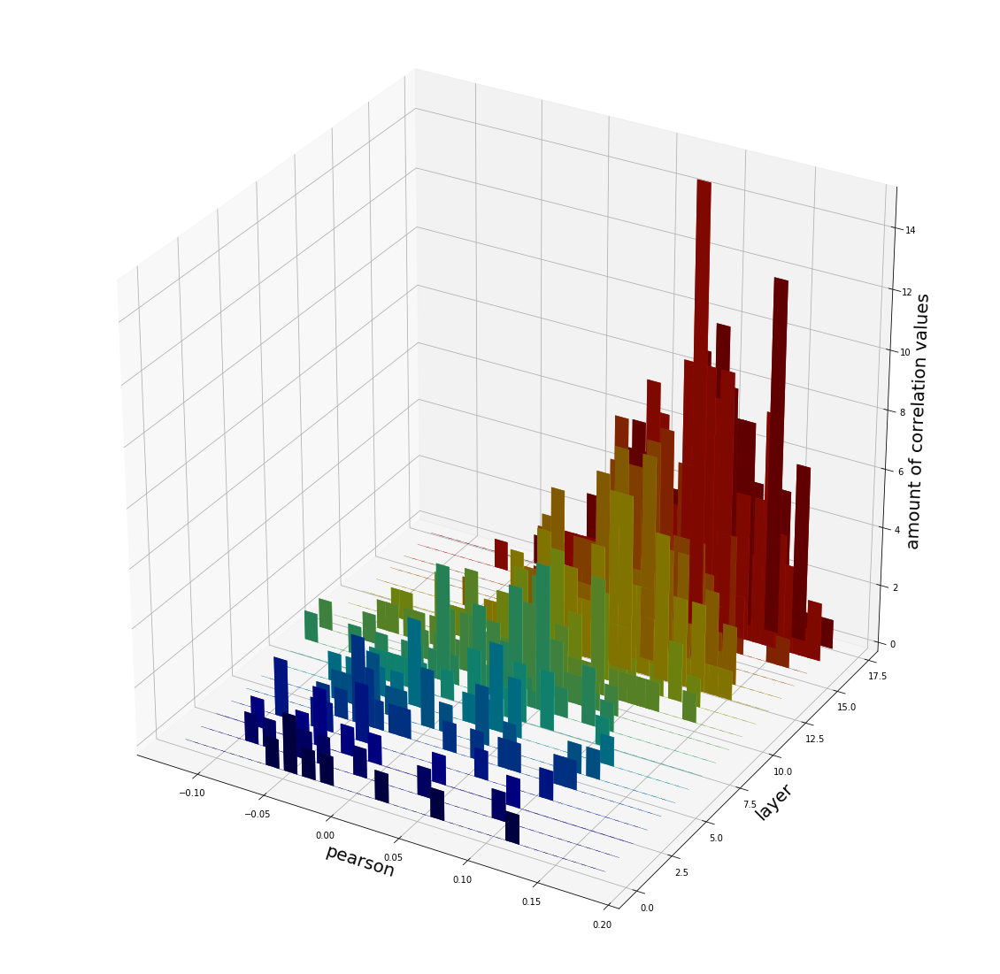

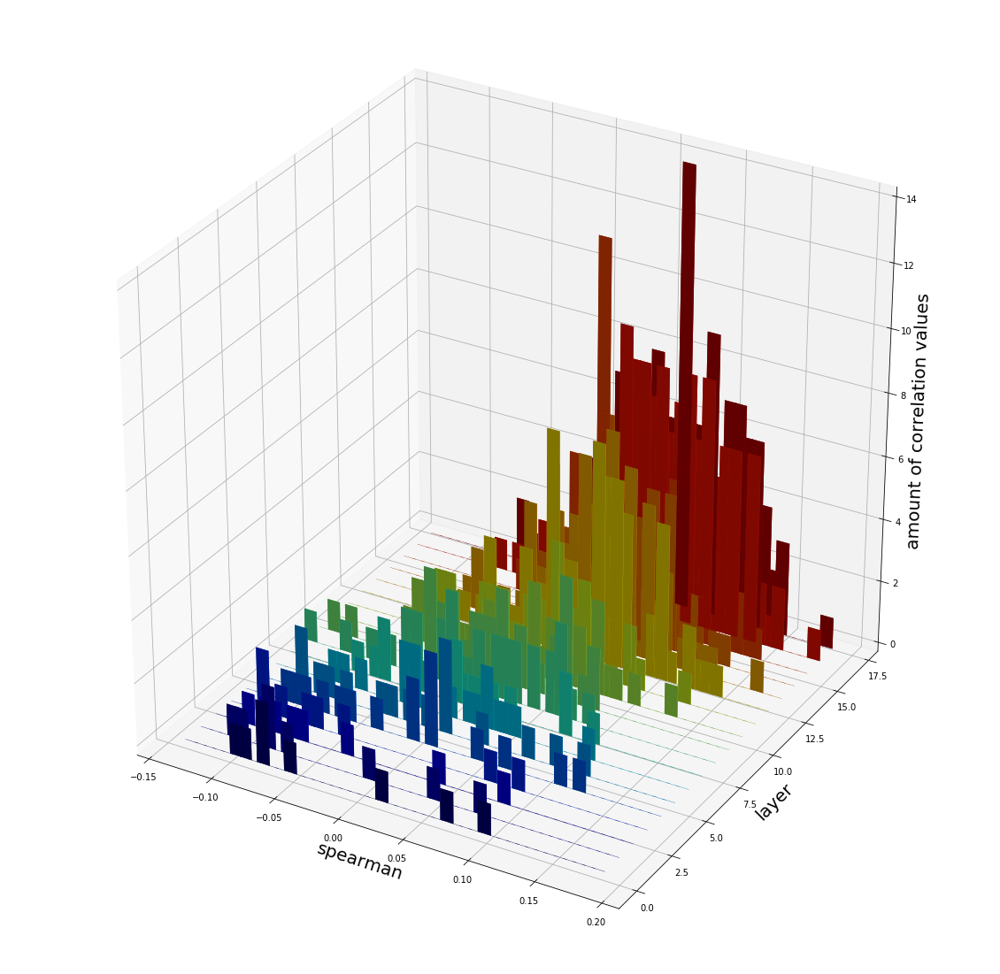

In [ ]:
h1 = Visualizer.hist3d(corrs, bins = 45, pearson = True, norm=False)
h2 = Visualizer.hist3d(corrs, bins = 45, pearson = False, norm=False)

Utils.add_fig_to_image(h1)
Utils.add_fig_to_image(h2)
Utils.save_combined_image(Utils.get_path(["03_autoencoder_activation_maps", "results"], "3d_hist_abs.png"),
                          show_image = False, combine_vertical = False)

## Round analysis

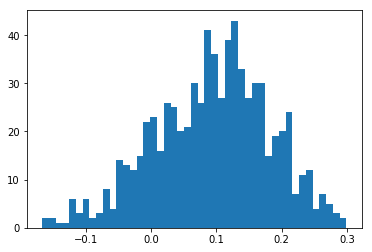

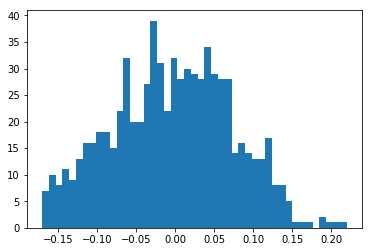

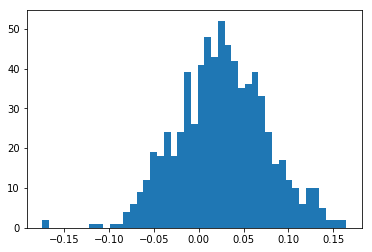

In [ ]:
corrs_round_1 = Correlation.correlate(activations_abs, neuro_spikes, start_round_frames[0], end_round_frames[0])
corrs_round_2 = Correlation.correlate(activations_abs, neuro_spikes, start_round_frames[1], end_round_frames[1])
corrs_round_3 = Correlation.correlate(activations_abs, neuro_spikes, start_round_frames[2], end_round_frames[2])

corrs_round_1_without_nan = [c.pearson for c in corrs_round_1 if not math.isnan(c.pearson) and c.pearson != 0]
corrs_round_2_without_nan = [c.pearson for c in corrs_round_2 if not math.isnan(c.pearson) and c.pearson != 0]
corrs_round_3_without_nan = [c.pearson for c in corrs_round_3 if not math.isnan(c.pearson) and c.pearson != 0]

plt.hist(corrs_round_1_without_nan, bins=45)
plt.show()

plt.hist(corrs_round_2_without_nan, bins=45)
plt.show()

plt.hist(corrs_round_3_without_nan, bins=45)
plt.show()

In [ ]:
max_pearson_round_1 = max(corrs_round_1, key=attrgetter('pearson'))
max_pearson_round_2 = max(corrs_round_2, key=attrgetter('pearson'))
max_pearson_round_3 = max(corrs_round_3, key=attrgetter('pearson'))

max_pearson_round_1.get_infos(), max_pearson_round_2.get_infos(), max_pearson_round_3.get_infos()

('layer 13, activation 25, row -1, column -1, pearson 0.29938300146183594, spearman 0.22347638469926473',
 'layer 16, activation 123, row -1, column -1, pearson 0.21964282352412318, spearman 0.17532725742742947',
 'layer 17, activation 123, row -1, column -1, pearson 0.16482153920930318, spearman 0.15080625526032249')

## Find filters with periodic patterns in windowed crosscorrelations

In [ ]:
corr_slices_20_round_1 = Correlation.correlate(activations_abs, neuro_spikes, start_round_frames[0],
                                               end_round_frames[0], window_size=20, spearman=False)

entry_count:  736 , windows:  74 , window_size:  20


In [ ]:
patterns = DistributionTest.test_distributions(corr_slices_20_round_1, activations_abs , neuro_spikes,
                                               window_size=20, start_frames=start_round_frames,
                                               exclude_start_frame_num=0)

Layer finished : 17

In [ ]:
ks_p_sorted = sorted(patterns, key=attrgetter('ks_p'), reverse=False)
ks_statistic_sorted = sorted(patterns, key=attrgetter('ks_statistic'), reverse=True)

for i in range(10):
    ks = ks_p_sorted[i]
    print("Layer {}, activation map {}, ks_p {}".format(ks.layer, ks.filter_num, ks.ks_p))

Layer 15, activation map 63, ks_p 1.6035469241011296e-32
Layer 14, activation map 63, ks_p 1.6818926931119032e-28
Layer 12, activation map 8, ks_p 2.5444526544385943e-28
Layer 13, activation map 8, ks_p 3.67831127912853e-24
Layer 10, activation map 28, ks_p 4.061442705761238e-24
Layer 13, activation map 56, ks_p 4.392139783318364e-23
Layer 15, activation map 45, ks_p 5.916146238016506e-22
Layer 17, activation map 84, ks_p 6.940173154111423e-22
Layer 17, activation map 1, ks_p 1.88484329498192e-21
Layer 13, activation map 14, ks_p 2.8249498174503145e-21


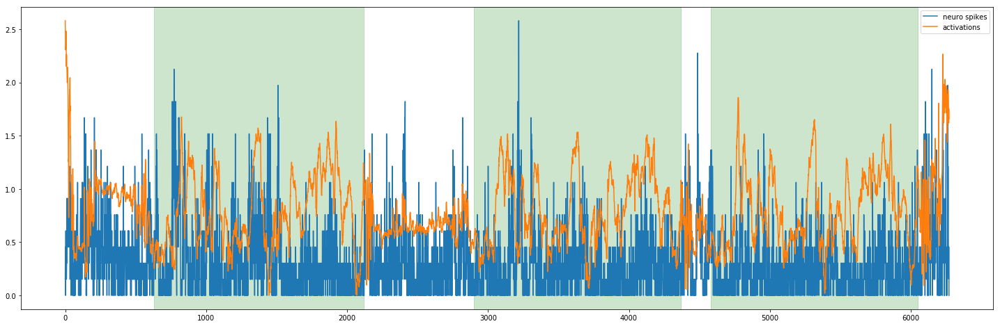

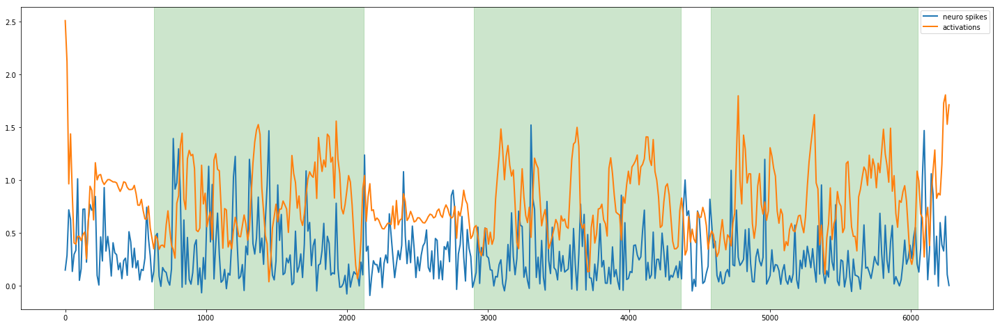

In [ ]:
Helper.plot_distr_test_result(ks_p_sorted[0], activations_abs, neuro_spikes, -1, -1, highlight=highlight)
Helper.plot_distr_test_result(ks_p_sorted[0], activations_abs, neuro_spikes, 500, 20, highlight=highlight)

In [ ]:
mw_p_sorted = sorted(patterns, key=attrgetter('mw_p'), reverse=False)
mw_statistic_sorted = sorted(patterns, key=attrgetter('mw_statistic'), reverse=False)

for i in range(10):
    mw = mw_p_sorted[i]
    print("Layer {}, activation map {}, mw_p {}".format(mw.layer, mw.filter_num, mw.mw_p))

Layer 15, activation map 63, mw_p 1.5512880737578925e-41
Layer 14, activation map 63, mw_p 1.3256008092218141e-39
Layer 10, activation map 28, mw_p 1.4177872286223276e-37
Layer 12, activation map 8, mw_p 3.7644050318225305e-33
Layer 11, activation map 28, mw_p 1.3998510184143079e-31
Layer 16, activation map 1, mw_p 3.6715298308087422e-31
Layer 13, activation map 8, mw_p 4.3478182868007025e-30
Layer 17, activation map 84, mw_p 5.900453823306365e-30
Layer 17, activation map 69, mw_p 1.9863726447864357e-29
Layer 13, activation map 59, mw_p 3.797736895332551e-27


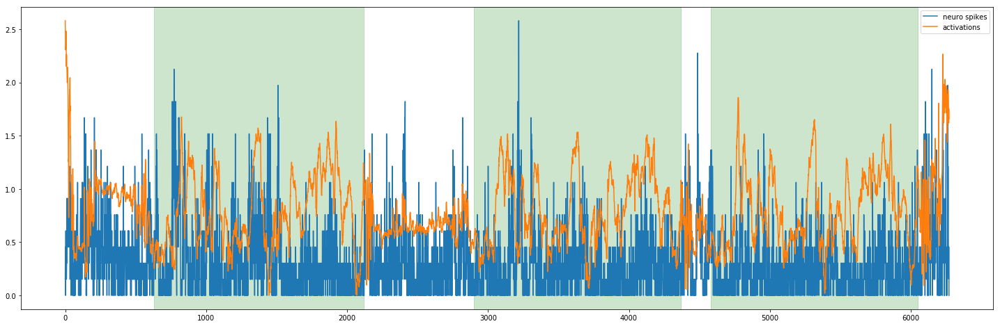

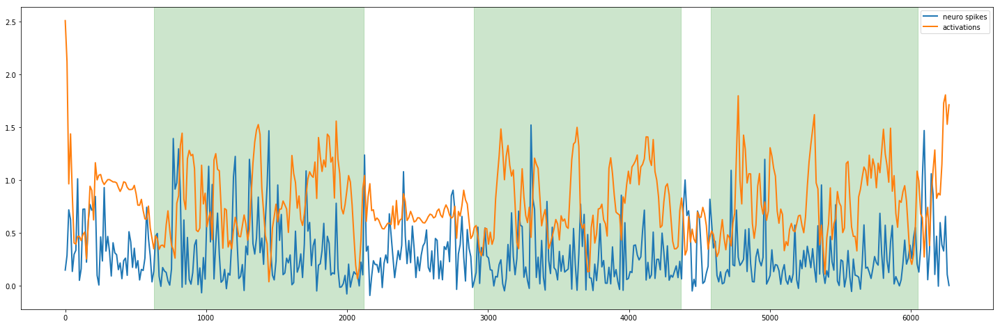

In [ ]:
Helper.plot_distr_test_result(mw_p_sorted[0], activations_abs, neuro_spikes, -1, -1, highlight=highlight)
Helper.plot_distr_test_result(mw_p_sorted[0], activations_abs, neuro_spikes, 500, 20, highlight=highlight)

# Correlate filters with neuro data (max(abs))

In [ ]:
activations_abs_max = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.max_abs)

## Global analysis

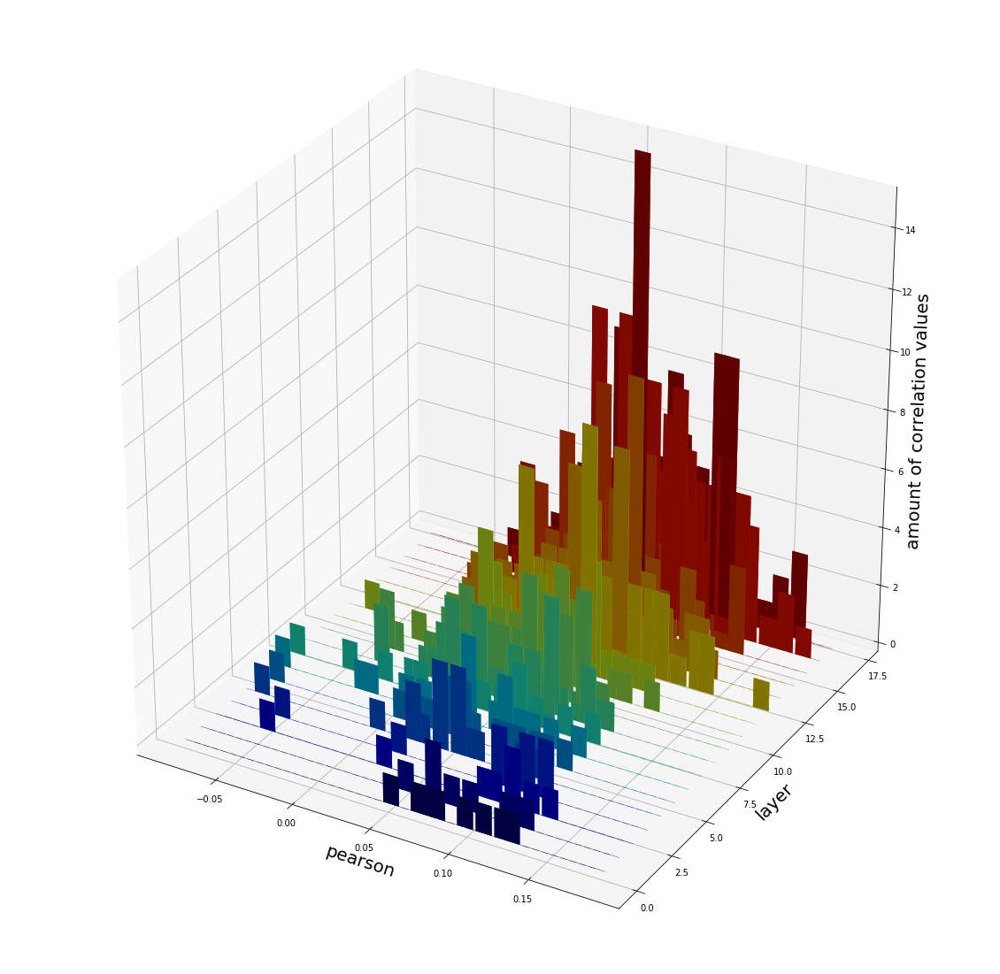

In [ ]:
corrs_abs_max = Correlation.correlate(activations_abs_max, neuro_spikes)

_ = Visualizer.hist3d(corrs_abs_max, bins = 45, pearson = True, norm = False)

## Round analysis

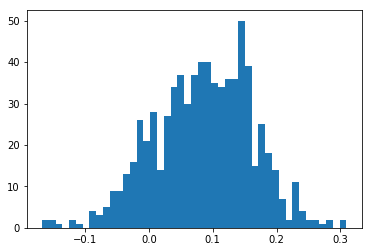

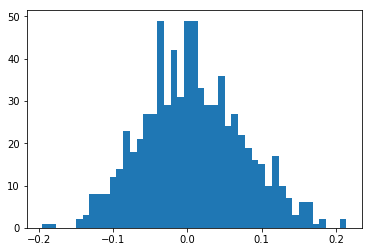

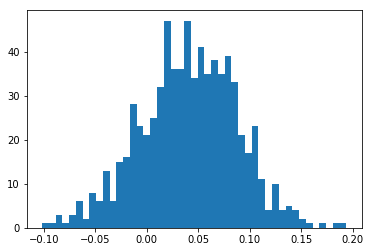

In [ ]:
corrs_round_1_abs_max = Correlation.correlate(activations_abs_max, neuro_spikes, start_round_frames[0],
                                              end_round_frames[0])
corrs_round_2_abs_max = Correlation.correlate(activations_abs_max, neuro_spikes, start_round_frames[1],
                                              end_round_frames[1])
corrs_round_3_abs_max = Correlation.correlate(activations_abs_max, neuro_spikes, start_round_frames[2],
                                              end_round_frames[2])

corrs_round_1_abs_max_without_nan = [c.pearson for c in corrs_round_1_abs_max if not math.isnan(c.pearson)
                                     and c.pearson != 0]
corrs_round_2_abs_max_without_nan = [c.pearson for c in corrs_round_2_abs_max if not math.isnan(c.pearson)
                                     and c.pearson != 0]
corrs_round_3_abs_max_without_nan = [c.pearson for c in corrs_round_3_abs_max if not math.isnan(c.pearson)
                                     and c.pearson != 0]

plt.hist(corrs_round_1_abs_max_without_nan, bins=45)
plt.show()

plt.hist(corrs_round_2_abs_max_without_nan, bins=45)
plt.show()

plt.hist(corrs_round_3_abs_max_without_nan, bins=45)
plt.show()

## Find filters with periodic patterns in windowed crosscorrelations

In [ ]:
corr_slices_20_abs_max_round_1 = Correlation.correlate(activations_abs_max, neuro_spikes, start_round_frames[0],
                                               end_round_frames[0], window_size=20, spearman=False)

entry_count:  736 , windows:  74 , window_size:  20


In [ ]:
patterns_abs_max = DistributionTest.test_distributions(corr_slices_20_abs_max_round_1, activations_abs_max,
                                                       neuro_spikes, window_size=20,
                                                       start_frames=start_round_frames, exclude_start_frame_num=0)

Layer finished : 17

In [ ]:
ks_p_sorted = sorted(patterns_abs_max, key=attrgetter('ks_p'), reverse=False)

for i in range(10):
    ks = ks_p_sorted[i]
    print("Layer {}, activation map {}, ks_p {}".format(ks.layer, ks.filter_num, ks.ks_p))

Layer 11, activation map 18, ks_p 1.6480538930356126e-38
Layer 14, activation map 25, ks_p 6.266647494290597e-35
Layer 9, activation map 7, ks_p 9.751352209196588e-33
Layer 8, activation map 19, ks_p 2.6559012715693927e-32
Layer 15, activation map 25, ks_p 1.0427919065984062e-31
Layer 15, activation map 63, ks_p 2.2537655677244703e-29
Layer 17, activation map 108, ks_p 7.539766502695438e-27
Layer 16, activation map 18, ks_p 3.833846682767878e-26
Layer 12, activation map 20, ks_p 1.4507029097867977e-24
Layer 16, activation map 117, ks_p 4.988034215456715e-24


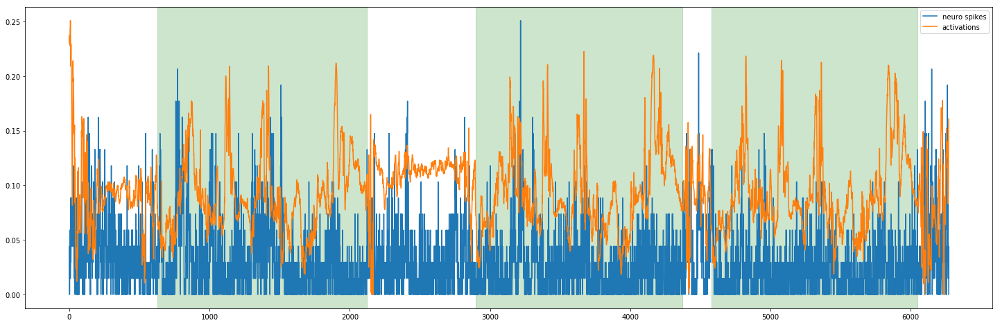

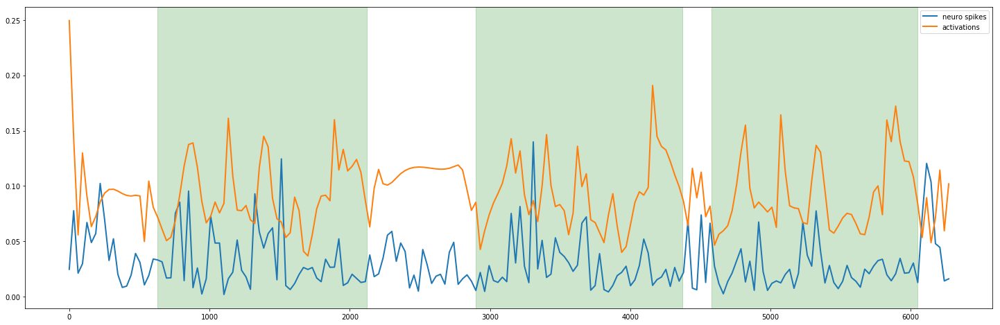

In [ ]:
Helper.plot_distr_test_result(ks_p_sorted[0], activations_abs_max, neuro_spikes, -1, -1, highlight=highlight)
Helper.plot_distr_test_result(ks_p_sorted[0], activations_abs_max, neuro_spikes, 200, 2, highlight=highlight)

In [ ]:
mw_p_sorted = sorted(patterns_abs_max, key=attrgetter('mw_p'), reverse=False)

for i in range(10):
    mw = mw_p_sorted[i]
    print("Layer {}, activation map {}, mw_p {}".format(mw.layer, mw.filter_num, mw.mw_p))

Layer 9, activation map 7, mw_p 4.696301046296855e-82
Layer 9, activation map 26, mw_p 6.0173420470472396e-61
Layer 6, activation map 5, mw_p 3.93509242167487e-59
Layer 7, activation map 5, mw_p 3.93509242167487e-59
Layer 14, activation map 25, mw_p 1.0777077509267211e-48
Layer 5, activation map 9, mw_p 3.199761220976517e-48
Layer 7, activation map 2, mw_p 3.907001507631044e-46
Layer 13, activation map 37, mw_p 8.503392272585591e-45
Layer 5, activation map 10, mw_p 2.4345874629189542e-42
Layer 11, activation map 30, mw_p 4.9561799573800453e-42


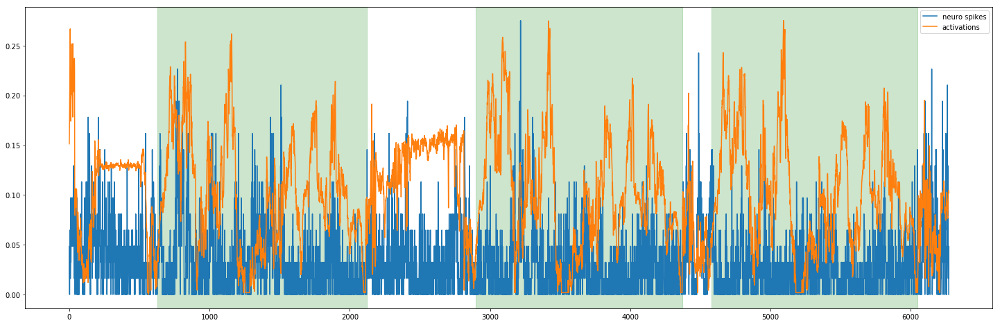

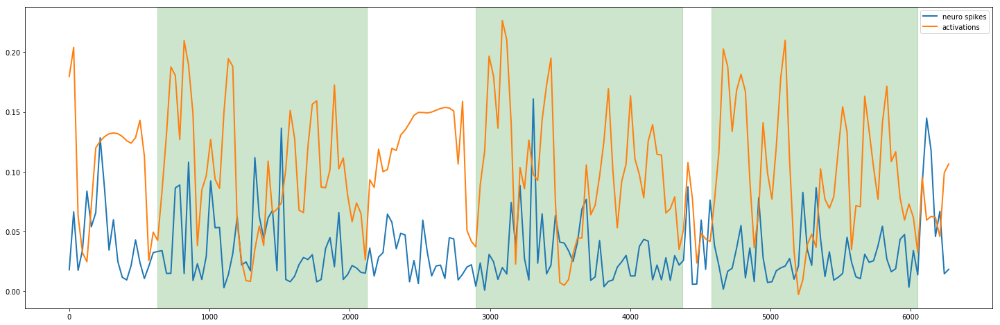

In [ ]:
Helper.plot_distr_test_result(mw_p_sorted[0], activations_abs_max, neuro_spikes, -1, -1, highlight=highlight)
Helper.plot_distr_test_result(mw_p_sorted[0], activations_abs_max, neuro_spikes, 200, 2, highlight=highlight)

### Score: p value & range between max/min values

__Previous results of best activations have low values. Try to find activations which have a low p-value in KS test while also having a wide range between max and min activation values.__

In [ ]:
def sort_by_score(patterns, activation_neurons):
    def sort_diff(item):
        series = activation_neurons[item.layer][item.filter_num]
        return max(series) - min(series)
    
    ks_p_sorted = sorted(patterns, key=attrgetter('ks_p'), reverse=False)
    diff_sorted = sorted(patterns, key=sort_diff, reverse=True)
    
    scores = []
    for i in range(len(ks_p_sorted)):
        score = len(ks_p_sorted) - i
        
        for x in range(len(diff_sorted)):
            if ks_p_sorted[i].layer == diff_sorted[x].layer and ks_p_sorted[i].filter_num == diff_sorted[x].filter_num:
                score += len(diff_sorted) - x
                break
                
        scores.append((ks_p_sorted[i], score))
        
    scores.sort(key=itemgetter(1))
    
    return [s[0] for s in scores]

In [ ]:
patterns_scored = sort_by_score(patterns_abs_max, activations_abs_max)

In [ ]:
for i in range(60):
    ks = patterns_scored[i]
    series = activations_abs_max[ks.layer][ks.filter_num]
    diff = max(series) - min(series)
    print("Layer {}, activation map {}, ks_p {},   diff {}".format(ks.layer, ks.filter_num, ks.ks_p, diff))

Layer 16, activation 16, ks_p 0.6229468344806389,   diff 0.0059678927063941956
Layer 17, activation 16, ks_p 0.6229468344806389,   diff 0.006270471960306168
Layer 16, activation 74, ks_p 0.43846228823666966,   diff 0.006017114967107773
Layer 17, activation 74, ks_p 0.43846228823666966,   diff 0.006322190165519714
Layer 16, activation 50, ks_p 0.5539552711569781,   diff 0.008311476558446884
Layer 17, activation 50, ks_p 0.5539552711569781,   diff 0.008732875809073448
Layer 16, activation 76, ks_p 0.4925193074945333,   diff 0.009713705629110336
Layer 17, activation 76, ks_p 0.4925193074945333,   diff 0.010206200182437897
Layer 16, activation 48, ks_p 0.8887410385572402,   diff 0.012510810047388077
Layer 17, activation 48, ks_p 0.8887410385572402,   diff 0.013145122677087784
Layer 16, activation 83, ks_p 0.1580582784000612,   diff 0.005113840103149414
Layer 16, activation 70, ks_p 0.6498555579774233,   diff 0.013005059212446213
Layer 17, activation 83, ks_p 0.1580582784000612,   diff 0.00

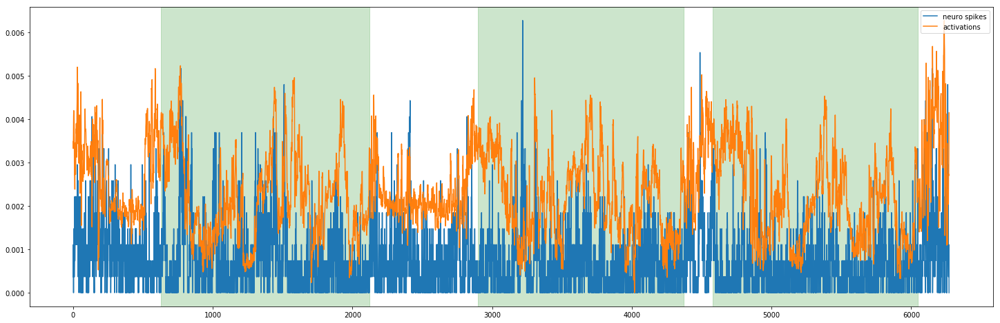

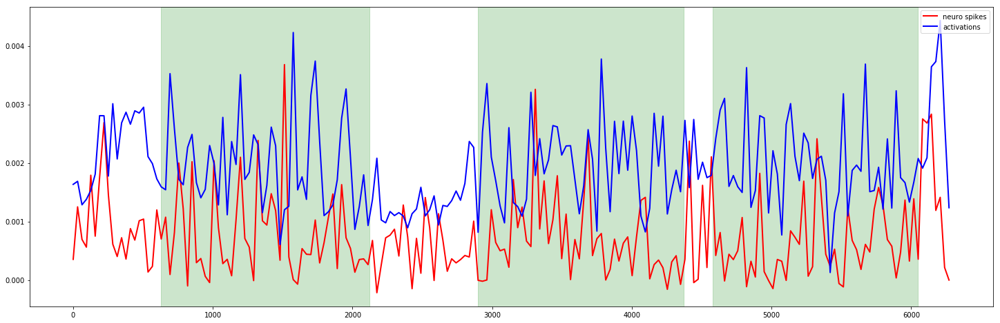

In [ ]:
Helper.plot_distr_test_result(patterns_scored[1], activations_abs_max, neuro_spikes, -1, -1, highlight=highlight)
Helper.plot_distr_test_result(patterns_scored[2], activations_abs_max, neuro_spikes, 200, 0, highlight=highlight)

# Correlate filters with neuro data (mean(abs))

__Same results an in section 2 since pearson correlation is invariant against linear transformation!__

In [ ]:
activations_abs_mean = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.mean_abs)

## Global analysis

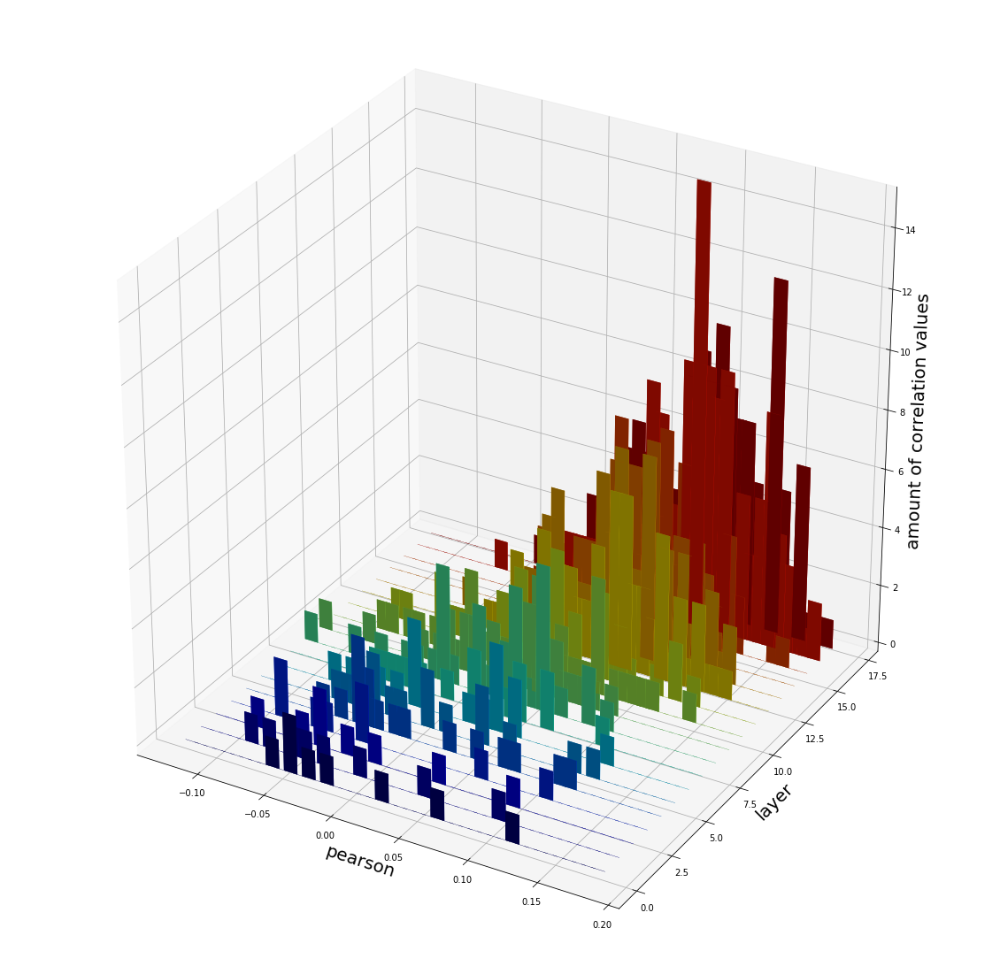

In [ ]:
corrs_abs_mean = Correlation.correlate(activations_abs_mean, neuro_spikes)

_ = Visualizer.hist3d(corrs_abs_mean, bins = 45, pearson = True, norm = False)

## Round analysis

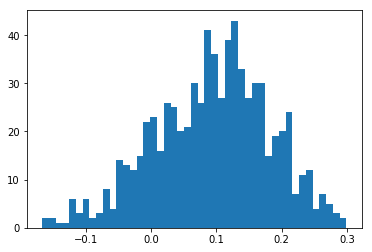

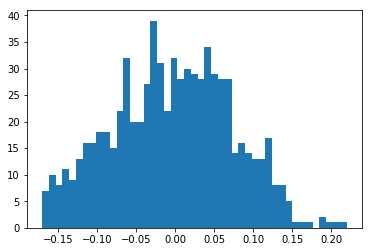

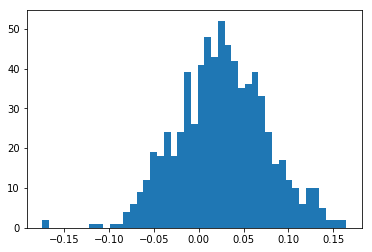

In [ ]:
corrs_round_1_abs_mean = Correlation.correlate(activations_abs_mean, neuro_spikes, start_round_frames[0],
                                               end_round_frames[0])
corrs_round_2_abs_mean = Correlation.correlate(activations_abs_mean, neuro_spikes, start_round_frames[1],
                                               end_round_frames[1])
corrs_round_3_abs_mean = Correlation.correlate(activations_abs_mean, neuro_spikes, start_round_frames[2],
                                               end_round_frames[2])

corrs_round_1_abs_mean_without_nan = [c.pearson for c in corrs_round_1_abs_mean if not math.isnan(c.pearson)
                                      and c.pearson != 0]
corrs_round_2_abs_mean_without_nan = [c.pearson for c in corrs_round_2_abs_mean if not math.isnan(c.pearson)
                                      and c.pearson != 0]
corrs_round_3_abs_mean_without_nan = [c.pearson for c in corrs_round_3_abs_mean if not math.isnan(c.pearson)
                                      and c.pearson != 0]

plt.hist(corrs_round_1_abs_mean_without_nan, bins=45)
plt.show()

plt.hist(corrs_round_2_abs_mean_without_nan, bins=45)
plt.show()

plt.hist(corrs_round_3_abs_mean_without_nan, bins=45)
plt.show()

## Find filters with periodic patterns in windowed crosscorrelations

In [ ]:
corr_slices_20_abs_mean_round_1 = Correlation.correlate(activations_abs_mean, neuro_spikes, start_round_frames[0],
                                                        end_round_frames[0], window_size=20, spearman=False)

entry_count:  736 , windows:  74 , window_size:  20


In [ ]:
patterns_abs_mean = DistributionTest.test_distributions(corr_slices_20_abs_mean_round_1, activations_abs_mean,
                                                        neuro_spikes, window_size=20,
                                                        start_frames=start_round_frames, exclude_start_frame_num=0)

Layer finished : 17

In [ ]:
ks_p_sorted = sorted(patterns_abs_mean, key=attrgetter('ks_p'), reverse=False)

for i in range(10):
    ks = ks_p_sorted[i]
    print("Layer {}, activation map {}, ks_p {}".format(ks.layer, ks.filter_num, ks.ks_p))

Layer 15, activation map 63, ks_p 1.6035469241011296e-32
Layer 14, activation map 63, ks_p 1.6818926931119032e-28
Layer 12, activation map 8, ks_p 2.5444526544385943e-28
Layer 13, activation map 8, ks_p 3.67831127912853e-24
Layer 10, activation map 28, ks_p 4.061442705761238e-24
Layer 13, activation map 56, ks_p 4.392139783318364e-23
Layer 15, activation map 45, ks_p 5.916146238016506e-22
Layer 17, activation map 84, ks_p 6.940173154111423e-22
Layer 17, activation map 1, ks_p 1.88484329498192e-21
Layer 13, activation map 14, ks_p 2.8249498174503145e-21


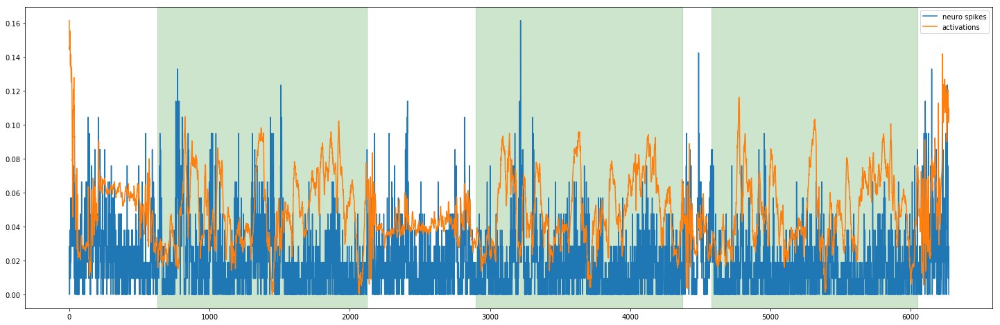

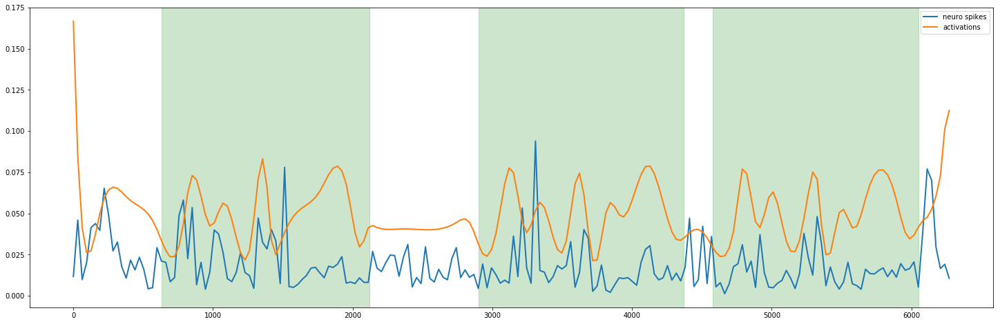

In [ ]:
Helper.plot_distr_test_result(ks_p_sorted[0], activations_abs_mean, neuro_spikes, -1, -1, highlight=highlight)
Helper.plot_distr_test_result(ks_p_sorted[0], activations_abs_mean, neuro_spikes, 200, 1, highlight=highlight)

In [ ]:
mw_p_sorted = sorted(patterns_abs_mean, key=attrgetter('mw_p'), reverse=False)

for i in range(10):
    mw = mw_p_sorted[i]
    print("Layer {}, activation map {}, mw_p {}".format(mw.layer, mw.filter_num, mw.mw_p))

Layer 15, activation map 63, mw_p 1.5512880737578925e-41
Layer 14, activation map 63, mw_p 1.3242209837547187e-39
Layer 10, activation map 28, mw_p 1.417069113880334e-37
Layer 12, activation map 8, mw_p 3.7644050318225305e-33
Layer 11, activation map 28, mw_p 1.3992036838262075e-31
Layer 16, activation map 1, mw_p 3.6732165521421515e-31
Layer 13, activation map 8, mw_p 4.349779158969315e-30
Layer 17, activation map 84, mw_p 5.8978000848694844e-30
Layer 17, activation map 69, mw_p 1.9837186665384246e-29
Layer 13, activation map 59, mw_p 3.792874511122159e-27


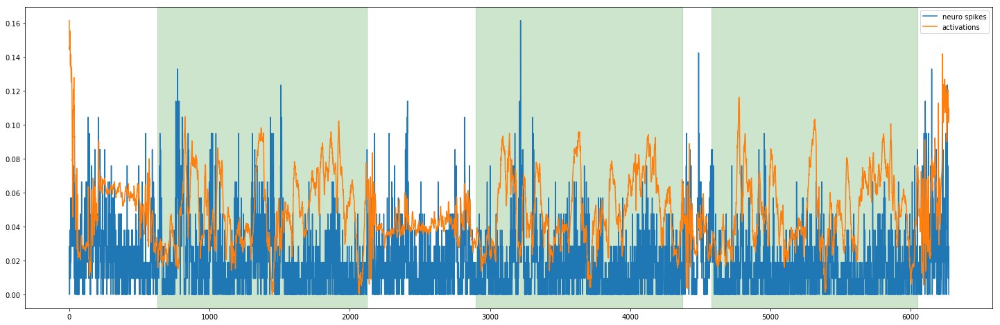

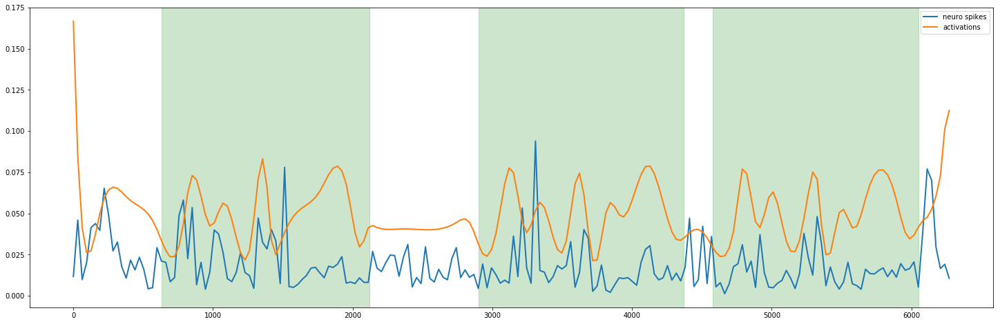

In [ ]:
Helper.plot_distr_test_result(mw_p_sorted[0], activations_abs_mean, neuro_spikes, -1, -1, highlight=highlight)
Helper.plot_distr_test_result(mw_p_sorted[0], activations_abs_mean, neuro_spikes, 200, 1, highlight=highlight)

## Straight lines

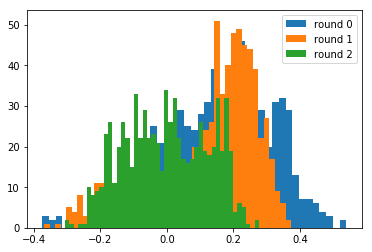

In [ ]:
Helper.round_hists(activations_abs_mean, neuro_spikes, start_frames, end_frames)

In [ ]:
start_frames_correlation = [start_flight_lines_round_1[0], start_flight_lines_round_2[0],
                            start_flight_lines_round_3[0]]
window_size = 20

patterns = Helper.get_distributions(activations_abs_mean, neuro_spikes, window_size, start_flight_lines_round_1[0],
                                    end_flight_lines_round_1[0], start_frames_correlation,
                                    exclude_start_frame_num=0)

entry_count:  736 , windows:  20 , window_size:  20
Layer finished : 17

KS test:
Layer 16, activation 97, ks_p 3.993918705597351e-47
Layer 17, activation 97, ks_p 6.41116460357622e-36
Layer 16, activation 1, ks_p 3.640002383026254e-31
Layer 17, activation 108, ks_p 8.032453611839605e-31
Layer 14, activation 39, ks_p 1.9997859476267095e-28
Layer 16, activation 108, ks_p 1.1197907793171756e-27
Layer 16, activation 127, ks_p 6.094676778183014e-24
Layer 15, activation 45, ks_p 1.2798509985501864e-23
Layer 17, activation 1, ks_p 3.4195123909995915e-23
Layer 16, activation 14, ks_p 3.7241883962207894e-23


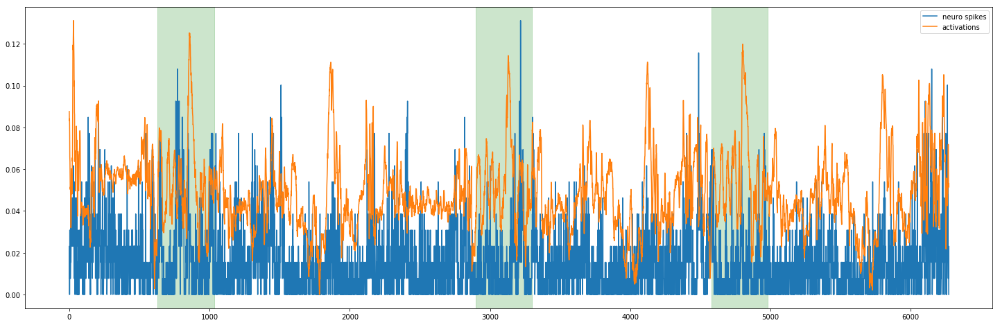

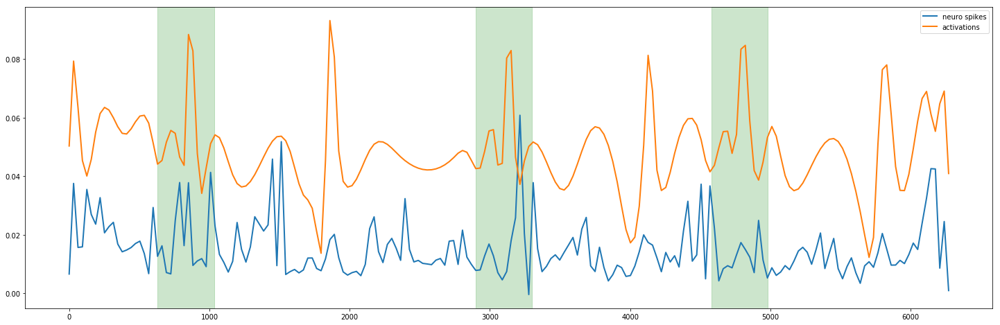


mannwhitneyu test:
Layer 16, activation 97, mw_p 4.219652472778642e-53
Layer 17, activation 97, mw_p 1.9475116194884835e-43
Layer 16, activation 1, mw_p 3.05173195013075e-38
Layer 17, activation 108, mw_p 2.1674640353106936e-35
Layer 16, activation 108, mw_p 3.0625407574806865e-33
Layer 16, activation 84, mw_p 4.2667182351096505e-30
Layer 17, activation 84, mw_p 5.974945671371598e-29
Layer 17, activation 1, mw_p 4.659827864448818e-28
Layer 15, activation 45, mw_p 5.952771365255692e-28
Layer 17, activation 127, mw_p 1.918940102715934e-27


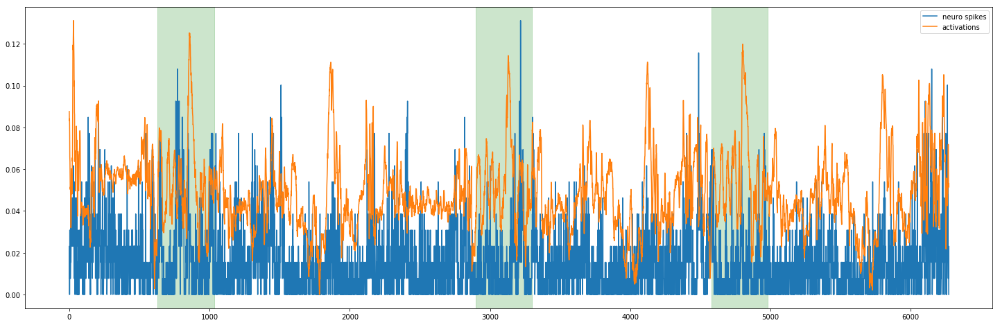

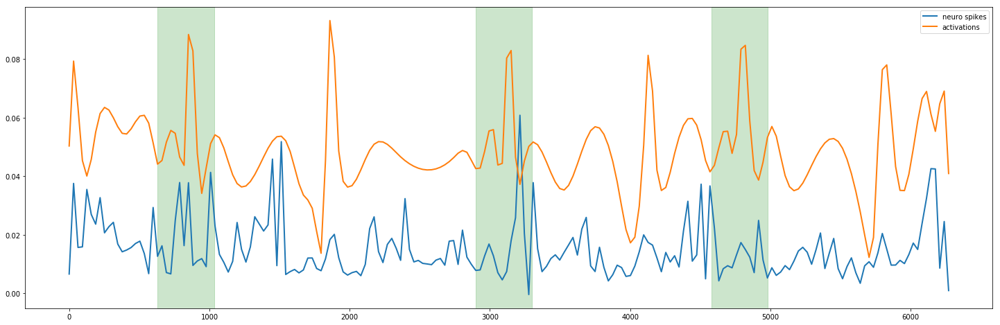

In [ ]:
highlight = [start_flight_lines_round_1[0], end_flight_lines_round_1[0],
            start_flight_lines_round_2[0], end_flight_lines_round_2[0],
            start_flight_lines_round_3[0], end_flight_lines_round_3[0]]

Helper.print_best_distributions(patterns, activations_abs_mean, neuro_spikes, highlight = highlight)

# Correlation with derivations (max(abs))

__Use derivations of activations and spike rate for correlation. Again, max(abs(activation_map))) is examined.__

In [ ]:
activations_abs_max = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.max_abs)
activations_abs_max_prime = []

for layer in range(len(activations_abs_max)):
    layer_values = []
    for activation in range(len(activations_abs_max[layer])):
        series = [activations_abs_max[layer][activation][0]]
        for i in range(1, len(activations_abs_max[layer][activation])):
            series.append(activations_abs_max[layer][activation][i]
                          - activations_abs_max[layer][activation][i - 1])
        
        layer_values.append(series)
        
    activations_abs_max_prime.append(np.array(layer_values))
        

neuro_spikes_prime = get_derived_neuro_spikes()

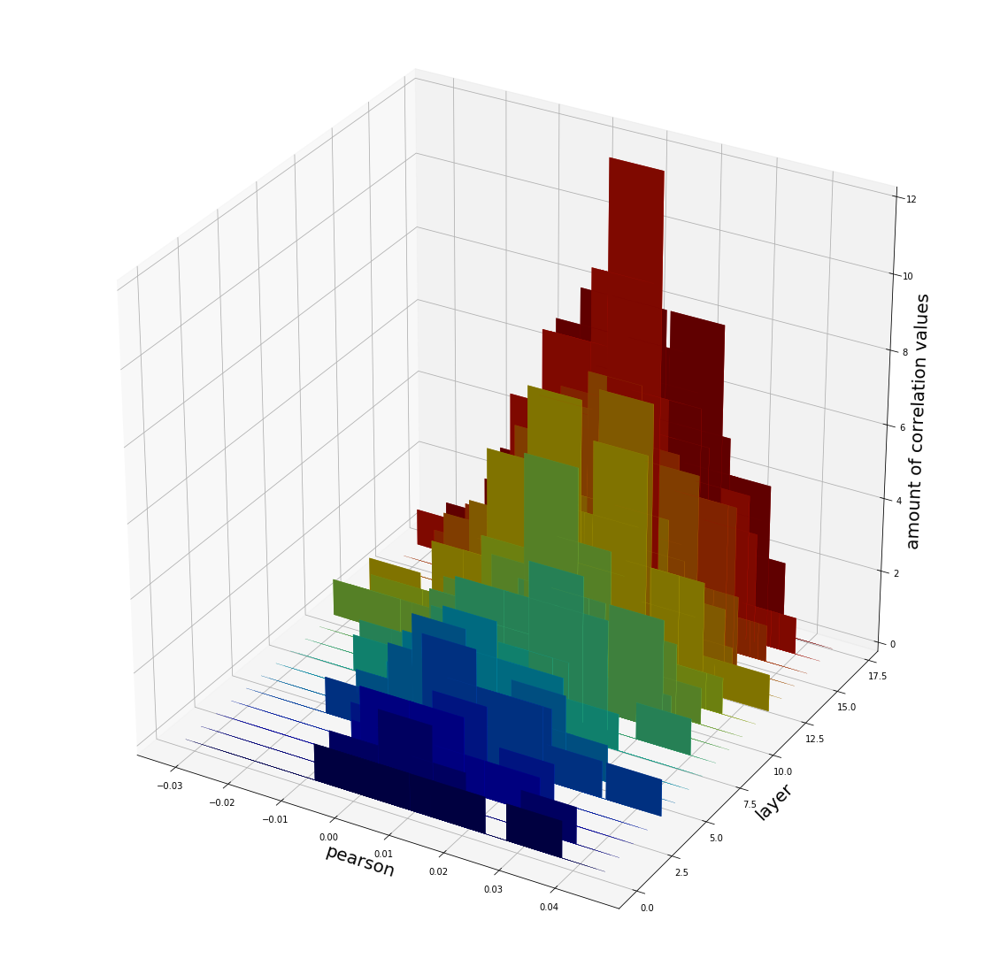

In [ ]:
Helper.global_hist(activations_abs_max_prime, neuro_spikes_prime)

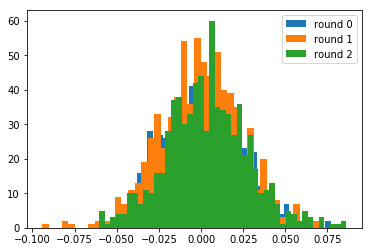

In [ ]:
Helper.round_hists(activations_abs_max_prime, neuro_spikes_prime, start_round_frames, end_round_frames)

In [ ]:
window_size = 20

patterns = Helper.get_distributions(activations_abs_max_prime, neuro_spikes_prime, window_size,
                                    start_round_frames[0], end_round_frames[0], start_round_frames,
                                    exclude_start_frame_num=0)

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17

KS test:
Layer 9, activation 7, ks_p 1.8968250783047582e-35
Layer 8, activation 18, ks_p 7.0950162751969815e-34
Layer 14, activation 46, ks_p 7.770696936030643e-33
Layer 17, activation 73, ks_p 5.544107277982573e-28
Layer 10, activation 29, ks_p 6.143523213906623e-28
Layer 2, activation 6, ks_p 5.897646248529251e-27
Layer 3, activation 6, ks_p 5.897646248529251e-27
Layer 4, activation 12, ks_p 3.3629891543563356e-26
Layer 9, activation 28, ks_p 5.564103486058222e-26
Layer 11, activation 21, ks_p 3.369374576359578e-24


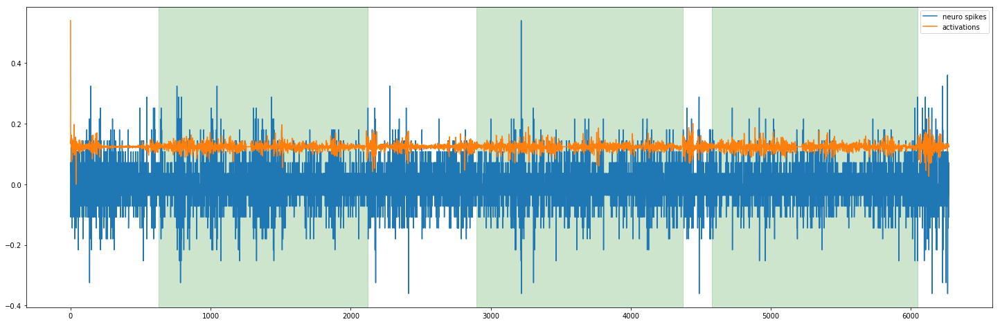

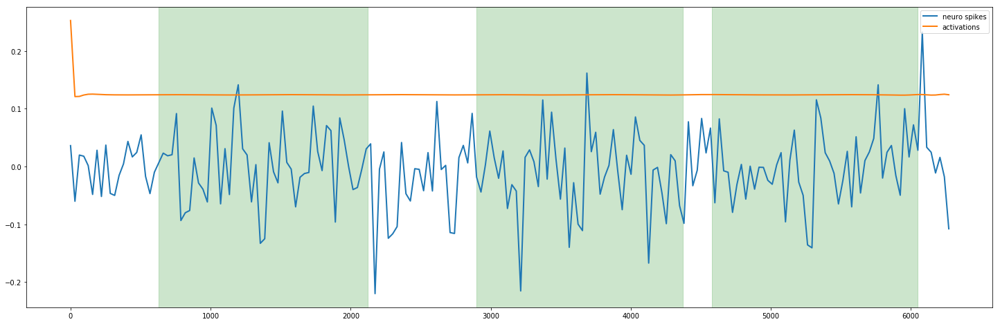


mannwhitneyu test:
Layer 9, activation 7, mw_p 2.1122133867823156e-84
Layer 14, activation 46, mw_p 3.265563177933646e-46
Layer 8, activation 18, mw_p 5.130346277244731e-45
Layer 10, activation 29, mw_p 1.958944491295159e-43
Layer 0, activation 0, mw_p 9.114066165385893e-38
Layer 1, activation 0, mw_p 9.114066165385893e-38
Layer 4, activation 5, mw_p 9.114066165385893e-38
Layer 4, activation 15, mw_p 9.114066165385893e-38
Layer 5, activation 5, mw_p 9.114066165385893e-38
Layer 5, activation 9, mw_p 9.114066165385893e-38


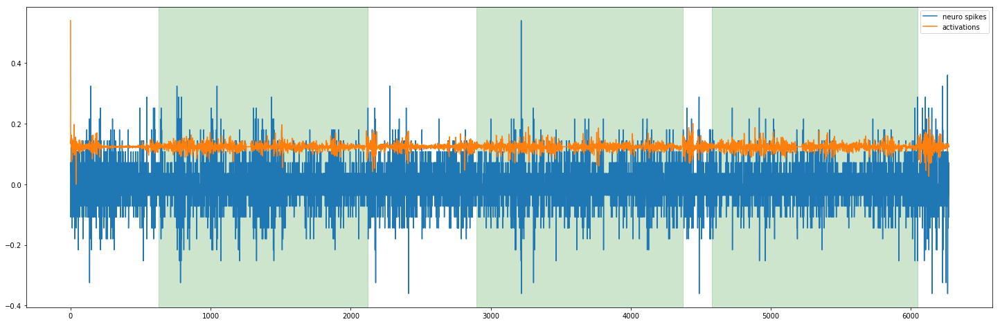

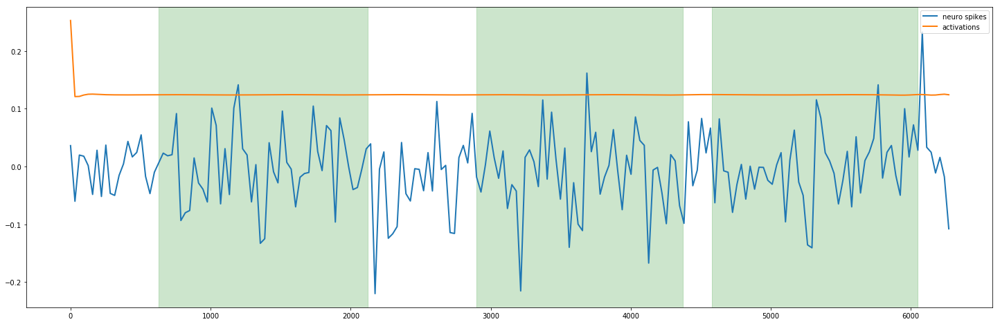

In [ ]:
Helper.print_best_distributions(patterns, activations_abs_max_prime, neuro_spikes_prime)

# Correlation with voltage of brain (not spike rate)

__Use raw voltage values of the bee's brain instead of the spike rate of these voltage values for correlation.__

In [ ]:
def load_voltage_data(csv_file_path, start_frame, length):
    neuro_data_left = np.zeros(length)
    neuro_data_right = np.zeros(length)

    with open(csv_file_path) as csvfile:
        neuroReader = csv.reader(csvfile)

        row_num = -1
        for row in neuroReader:
            row_num += 1

            if row_num < start_frame:
                continue

            if row_num - start_frame >= length:
                break

            neuro_data_left[row_num - start_frame] = int(row[9]) # voltage value of left wire
            neuro_data_right[row_num - start_frame] = int(row[10]) # voltage value of right wire
            
    return (neuro_data_left + neuro_data_right) // 2

In [ ]:
image_count = model_loader.get_image_count()

neuro_voltage = load_voltage_data(csv_file_path, 600, image_count)

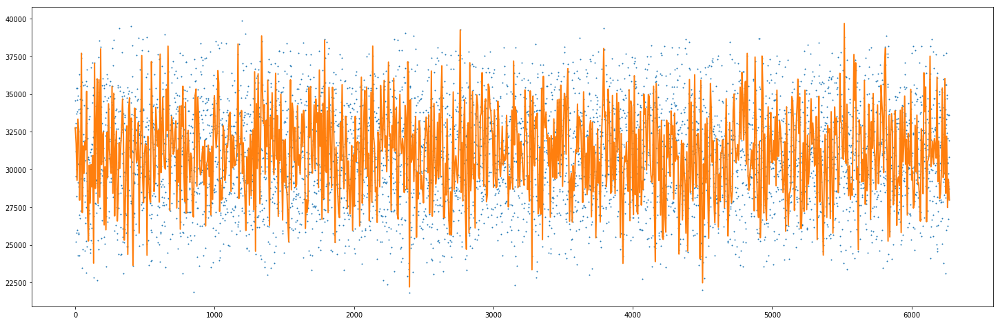

In [ ]:
Visualizer.plot(neuro_voltage, smooth_points = 1000, smoothness = 100)

## sum

__sum(abs)__

Global correlation:


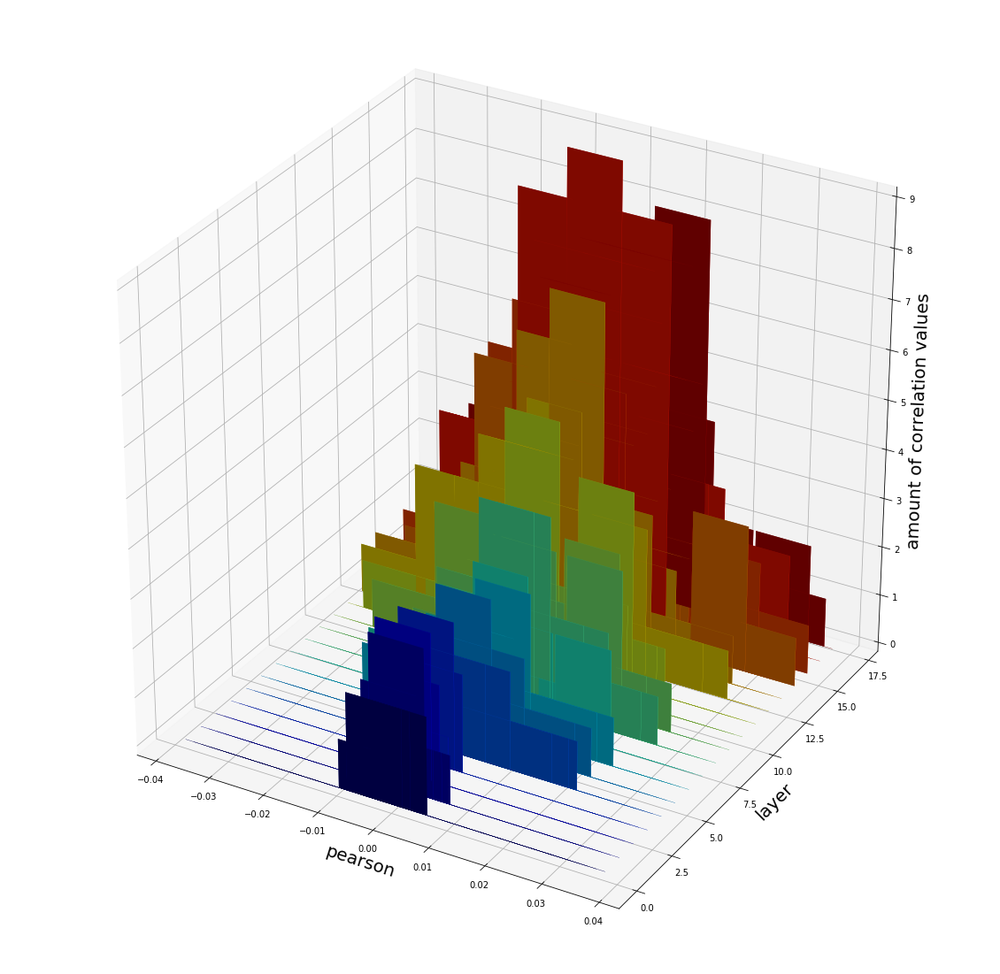

Correlation per round:


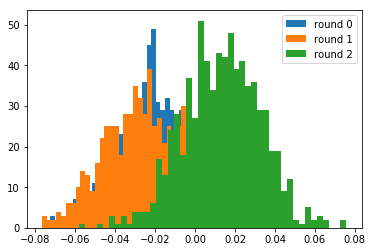

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17KS test:
Layer 16, activation 16, ks_p 4.167030739959805e-21
Layer 4, activation 13, ks_p 1.1550386862783022e-16
Layer 12, activation 0, ks_p 4.884981308350689e-15
Layer 9, activation 9, ks_p 9.547918011776346e-15
Layer 16, activation 56, ks_p 1.4210854715202004e-14
Layer 17, activation 56, ks_p 3.086420008457935e-14
Layer 14, activation 17, ks_p 6.084022174945858e-14
Layer 13, activation 42, ks_p 1.4666046155298318e-13
Layer 15, activation 17, ks_p 3.2585045772748344e-13
Layer 8, activation 7, ks_p 4.0467629247586956e-13


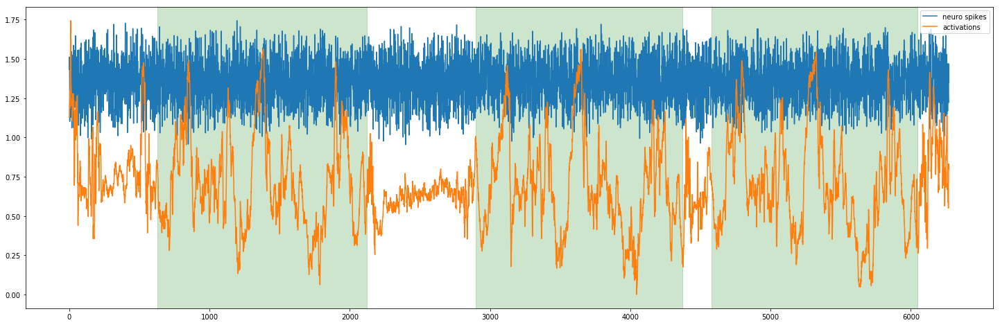

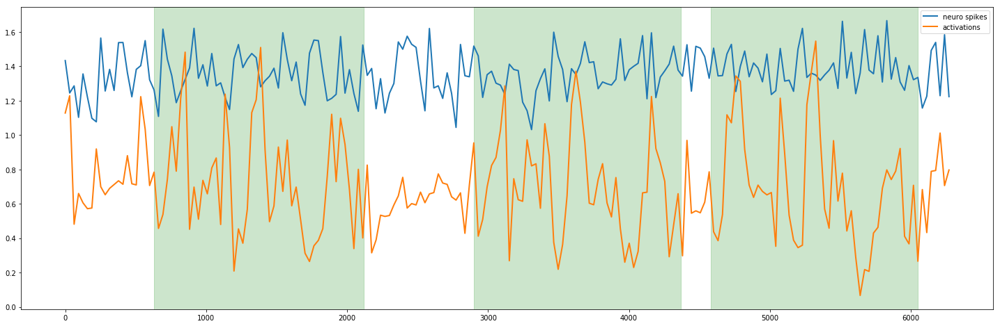


mannwhitneyu test:
Layer 16, activation 16, mw_p 5.260214556662799e-23
Layer 13, activation 42, mw_p 1.0983970632147766e-19
Layer 16, activation 114, mw_p 2.2425016768409596e-19
Layer 12, activation 42, mw_p 1.861426433281131e-18
Layer 4, activation 13, mw_p 9.876780220083717e-18
Layer 14, activation 17, mw_p 5.495189062775561e-17
Layer 15, activation 17, mw_p 9.331915698103041e-17
Layer 17, activation 56, mw_p 2.1364867465338074e-15
Layer 16, activation 56, mw_p 5.582548678624708e-15
Layer 16, activation 32, mw_p 7.746702670631365e-15


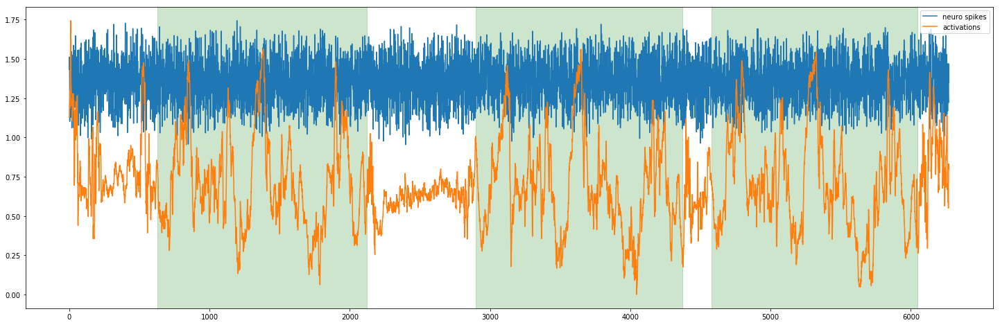

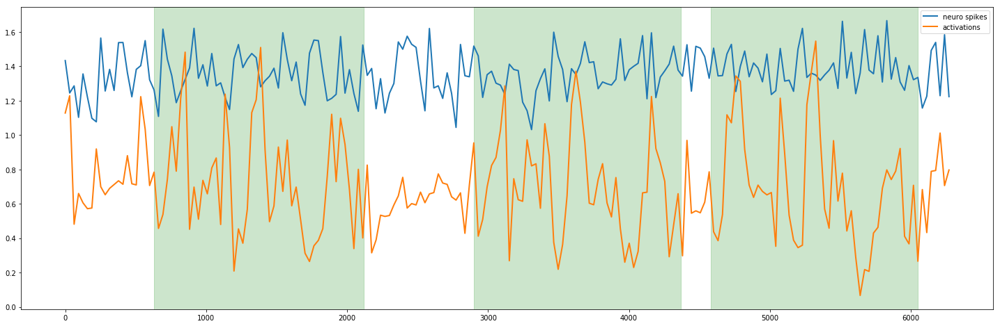

In [ ]:
activations = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.sum_abs)
evaluate(activations, neuro_data)

__sum()__

Global correlation:


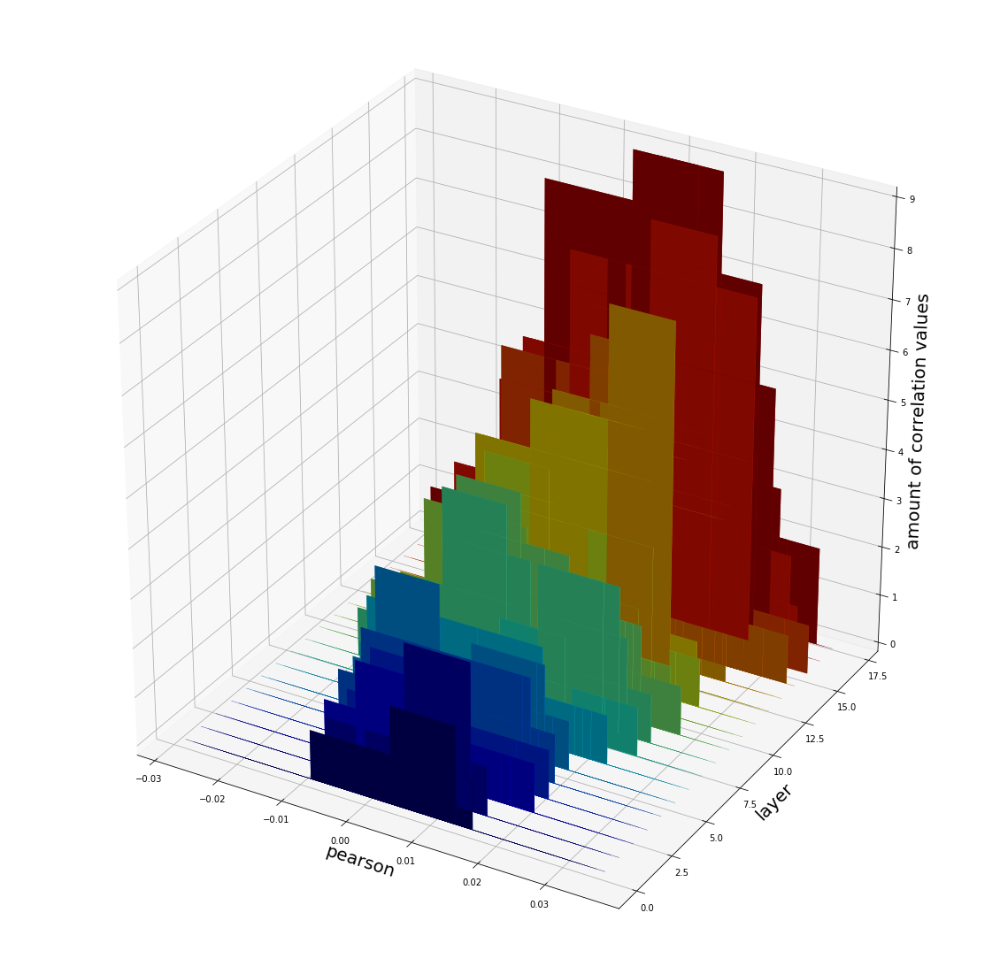

Correlation per round:


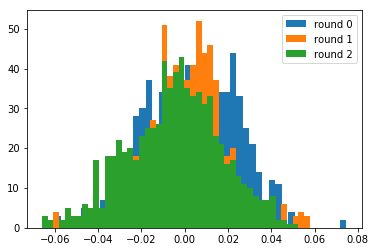

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17KS test:
Layer 6, activation 13, ks_p 1.7427522054866403e-26
Layer 7, activation 9, ks_p 1.8793969417260987e-22
Layer 7, activation 13, ks_p 7.935698640109169e-22
Layer 12, activation 48, ks_p 2.851855878079586e-20
Layer 10, activation 16, ks_p 8.85413776980246e-20
Layer 6, activation 9, ks_p 3.16990193286096e-18
Layer 13, activation 48, ks_p 3.608258532182362e-16
Layer 10, activation 9, ks_p 5.514523387047076e-16
Layer 12, activation 25, ks_p 3.3306690738754696e-15
Layer 11, activation 9, ks_p 8.326672684688674e-15


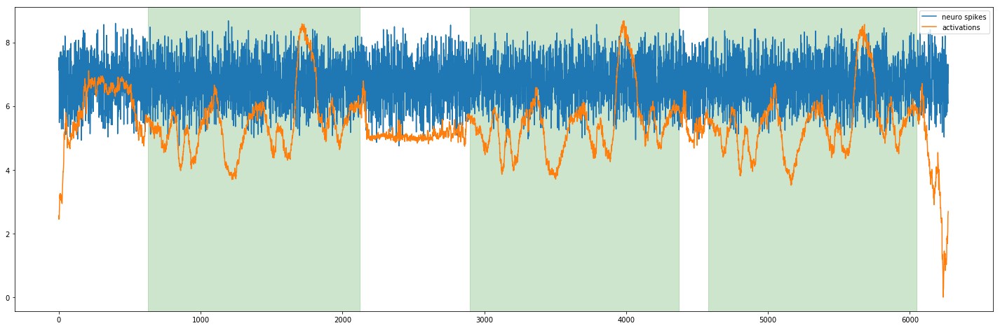

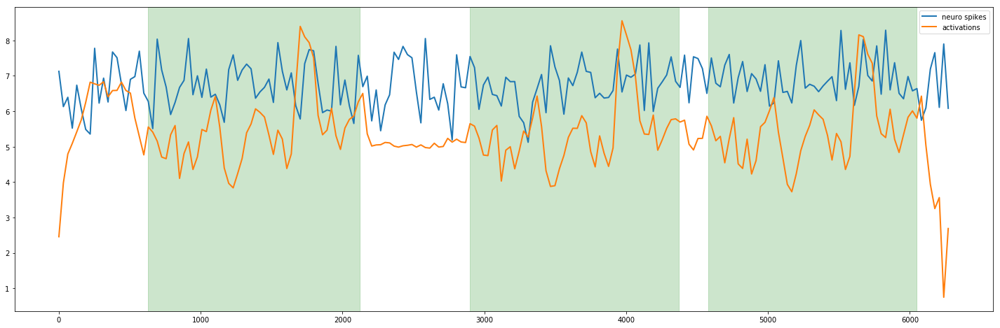


mannwhitneyu test:
Layer 6, activation 13, mw_p 3.923766858381888e-35
Layer 12, activation 48, mw_p 2.8228097025762743e-32
Layer 7, activation 9, mw_p 1.5440192883564943e-31
Layer 7, activation 13, mw_p 1.1294841256069657e-29
Layer 13, activation 48, mw_p 1.8619218693830447e-25
Layer 10, activation 9, mw_p 1.2763621009988038e-22
Layer 10, activation 16, mw_p 1.9089533841473488e-21
Layer 12, activation 43, mw_p 4.073727160331073e-21
Layer 11, activation 9, mw_p 1.809415781890995e-19
Layer 12, activation 25, mw_p 3.683924965934125e-18


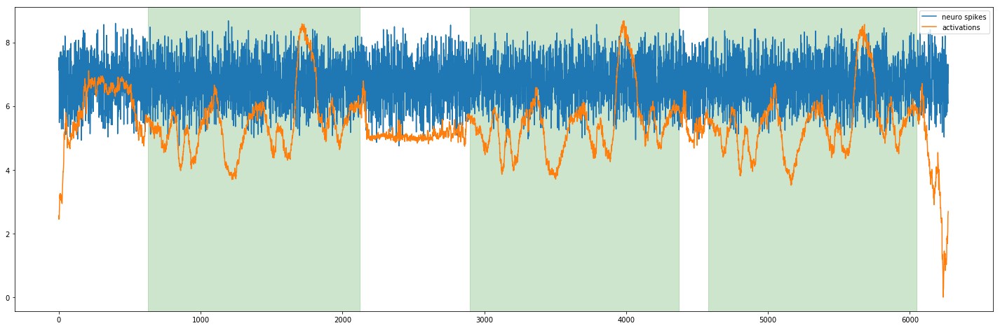

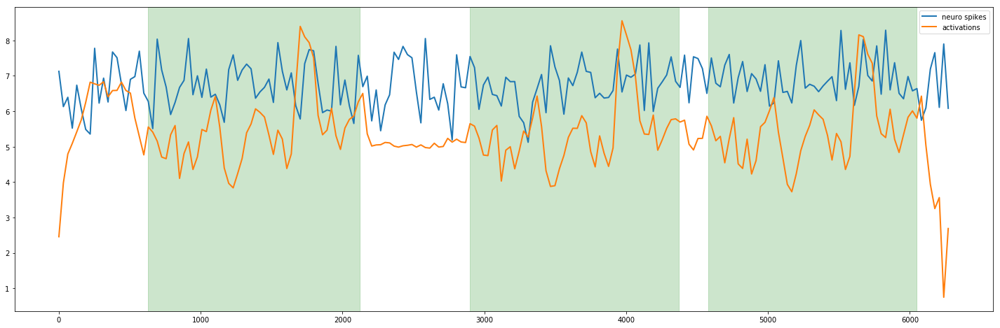

In [ ]:
activations = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.sum)
evaluate(activations, neuro_data)

## max

__max(abs)__

Global correlation:


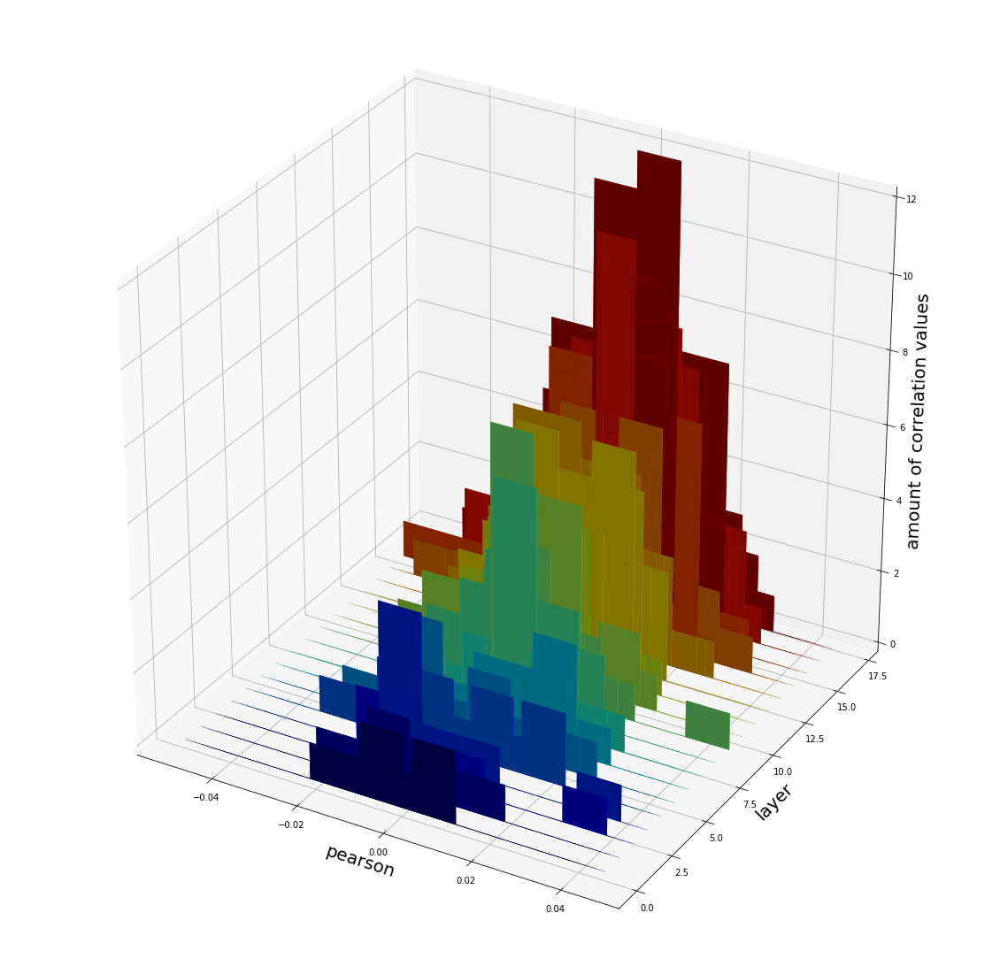

Correlation per round:


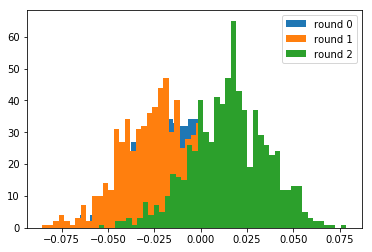

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17KS test:
Layer 9, activation 7, ks_p 9.751352209196588e-33
Layer 14, activation 11, ks_p 2.7636288359551526e-32
Layer 17, activation 95, ks_p 8.622267505008222e-25
Layer 15, activation 53, ks_p 4.000023910874944e-24
Layer 15, activation 57, ks_p 3.6587583051317615e-23
Layer 17, activation 71, ks_p 7.625815705326373e-22
Layer 8, activation 20, ks_p 2.6774752731198083e-21
Layer 8, activation 2, ks_p 4.8901394406117424e-21
Layer 13, activation 36, ks_p 6.426327259600328e-21
Layer 9, activation 2, ks_p 6.719630028115275e-20


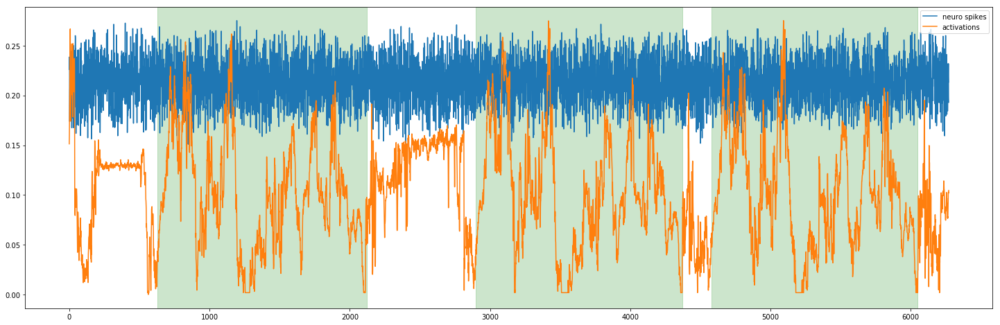

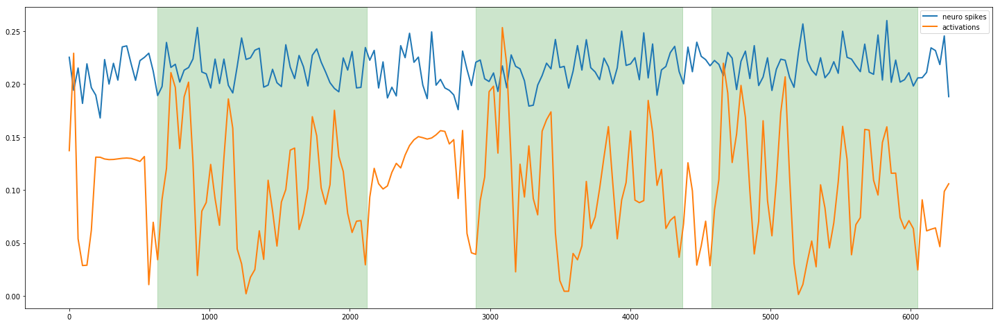


mannwhitneyu test:
Layer 9, activation 7, mw_p 4.696301046296855e-82
Layer 9, activation 26, mw_p 1.974914249946221e-60
Layer 6, activation 5, mw_p 3.93509242167487e-59
Layer 7, activation 5, mw_p 3.93509242167487e-59
Layer 5, activation 9, mw_p 3.199761220976517e-48
Layer 7, activation 2, mw_p 3.907001507631044e-46
Layer 13, activation 37, mw_p 8.503392272585591e-45
Layer 5, activation 10, mw_p 2.4345874629189542e-42
Layer 11, activation 30, mw_p 4.9561799573800453e-42
Layer 14, activation 11, mw_p 5.485558957170231e-42


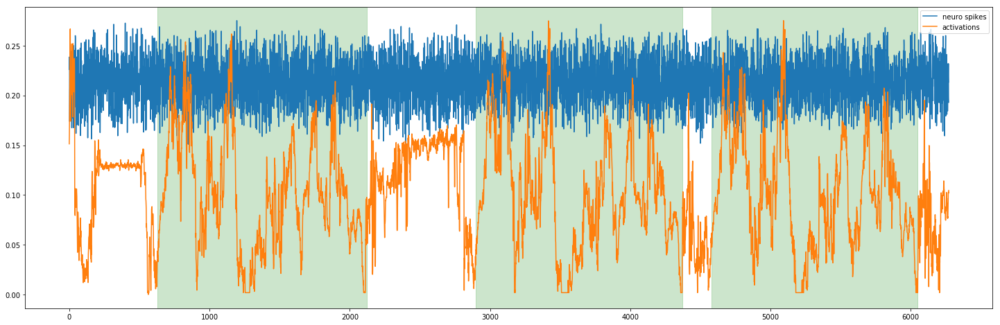

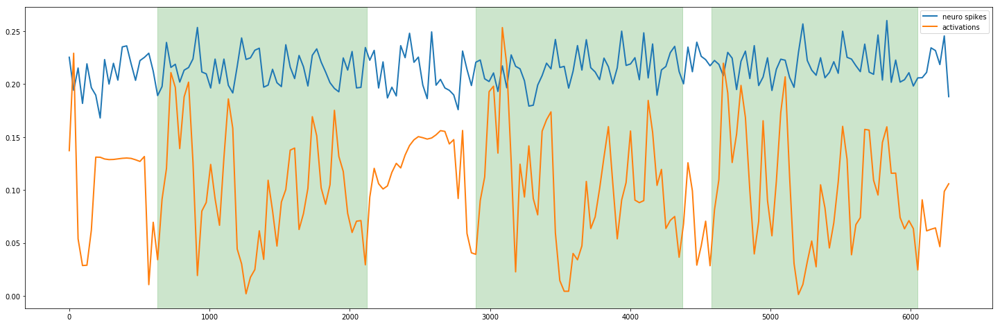

In [ ]:
activations = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.max_abs)
evaluate(activations, neuro_data)

__max()__

Global correlation:


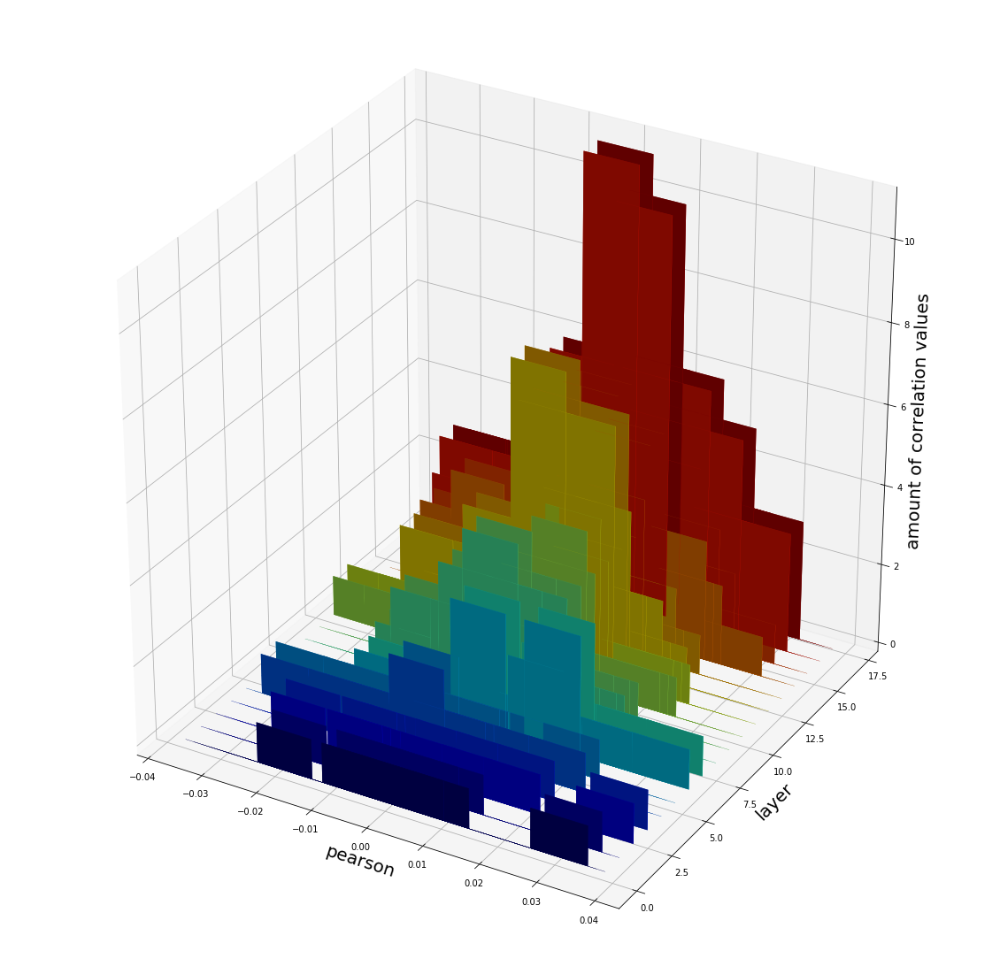

Correlation per round:


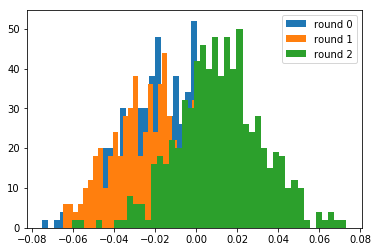

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17KS test:
Layer 12, activation 47, ks_p 5.450200344561253e-23
Layer 13, activation 47, ks_p 5.450200344561253e-23
Layer 9, activation 10, ks_p 2.8230659368876303e-22
Layer 8, activation 10, ks_p 3.389099155460762e-22
Layer 16, activation 91, ks_p 2.0639497798800192e-19
Layer 17, activation 91, ks_p 2.0639497798800192e-19
Layer 4, activation 2, ks_p 3.2120407804908746e-18
Layer 5, activation 2, ks_p 3.2120407804908746e-18
Layer 2, activation 5, ks_p 1.2816258100782443e-16
Layer 3, activation 5, ks_p 1.2816258100782443e-16


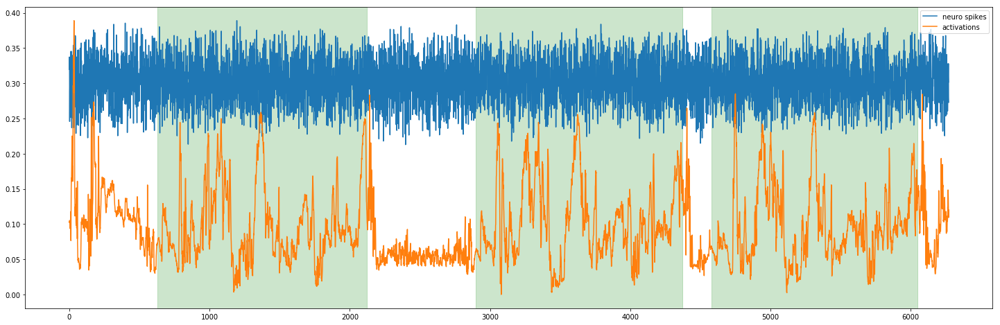

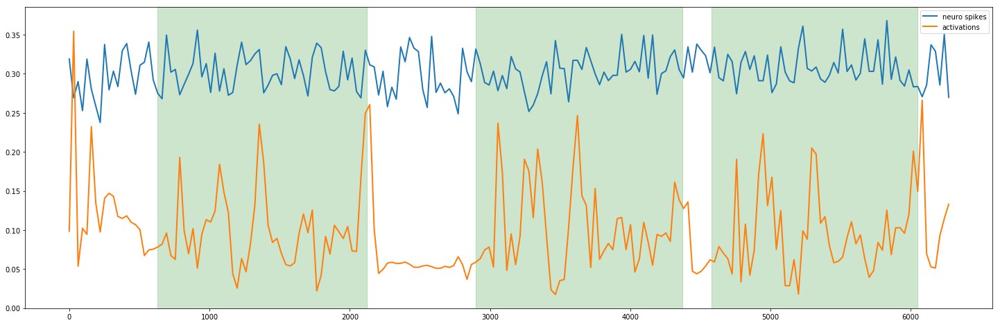


mannwhitneyu test:
Layer 4, activation 8, mw_p 3.73267625685885e-54
Layer 5, activation 8, mw_p 3.73267625685885e-54
Layer 2, activation 5, mw_p 7.871748830508413e-47
Layer 3, activation 5, mw_p 7.871748830508413e-47
Layer 0, activation 2, mw_p 9.114066165385893e-38
Layer 0, activation 5, mw_p 9.114066165385893e-38
Layer 0, activation 7, mw_p 9.114066165385893e-38
Layer 1, activation 2, mw_p 9.114066165385893e-38
Layer 1, activation 5, mw_p 9.114066165385893e-38
Layer 1, activation 7, mw_p 9.114066165385893e-38


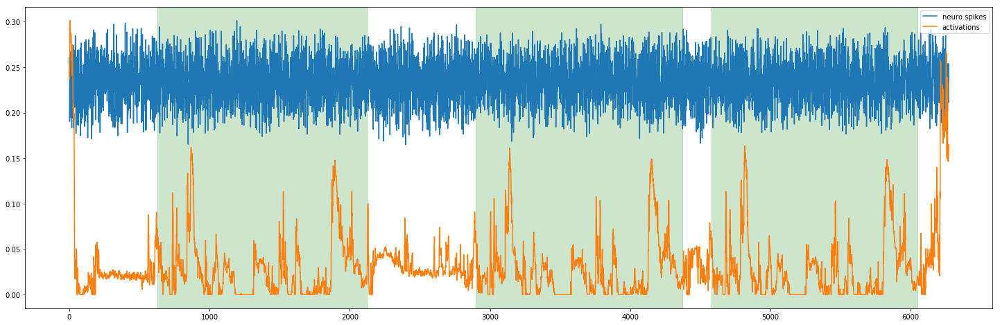

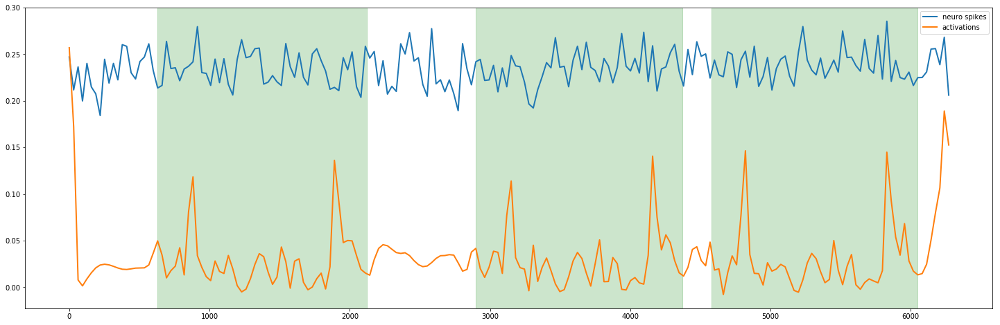

In [ ]:
activations = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.max)
evaluate(activations, neuro_data)

## mean

__mean(abs)__

Global correlation:


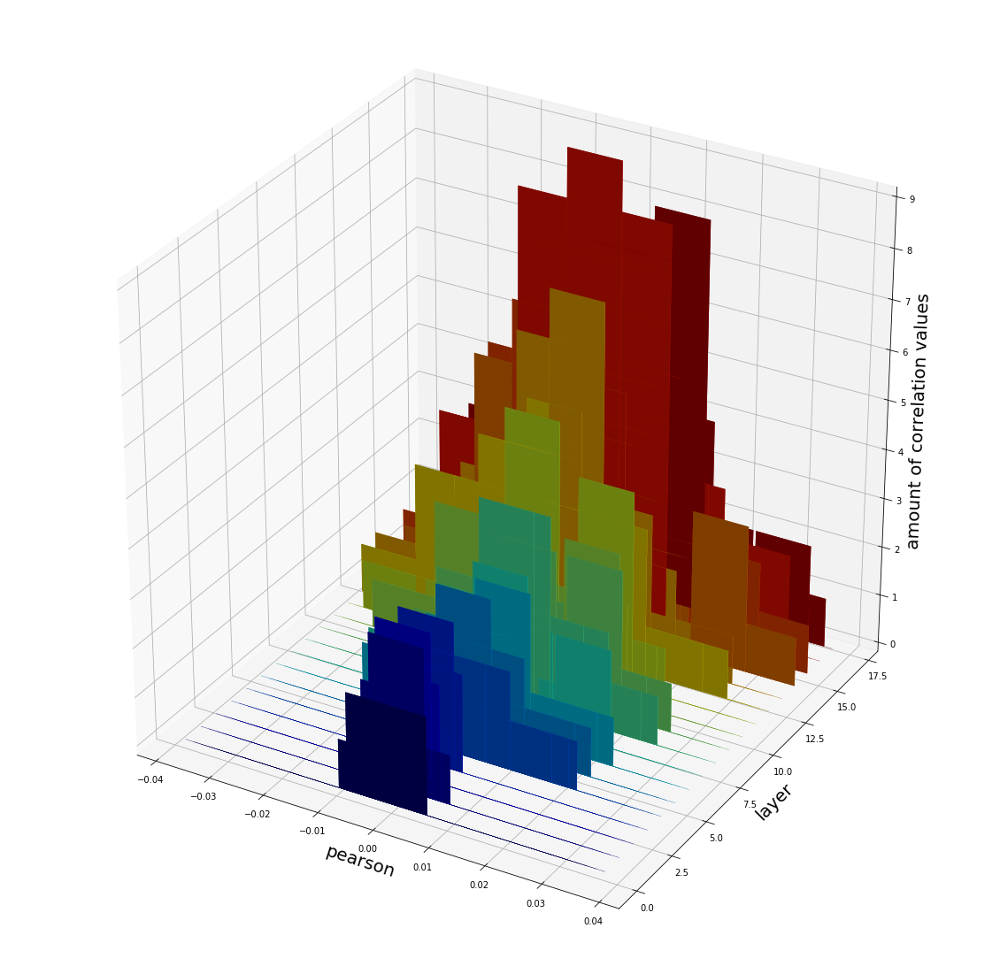

Correlation per round:


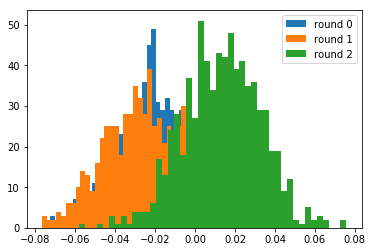

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17KS test:
Layer 16, activation 16, ks_p 4.167030739959805e-21
Layer 4, activation 13, ks_p 1.1550386862783022e-16
Layer 12, activation 0, ks_p 4.884981308350689e-15
Layer 9, activation 9, ks_p 9.547918011776346e-15
Layer 16, activation 56, ks_p 1.4210854715202004e-14
Layer 17, activation 56, ks_p 3.086420008457935e-14
Layer 14, activation 17, ks_p 6.084022174945858e-14
Layer 13, activation 42, ks_p 1.4666046155298318e-13
Layer 15, activation 17, ks_p 3.2585045772748344e-13
Layer 8, activation 7, ks_p 4.0467629247586956e-13


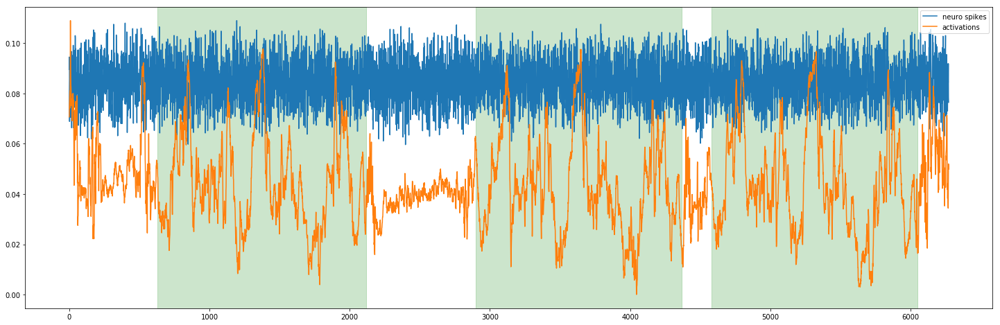

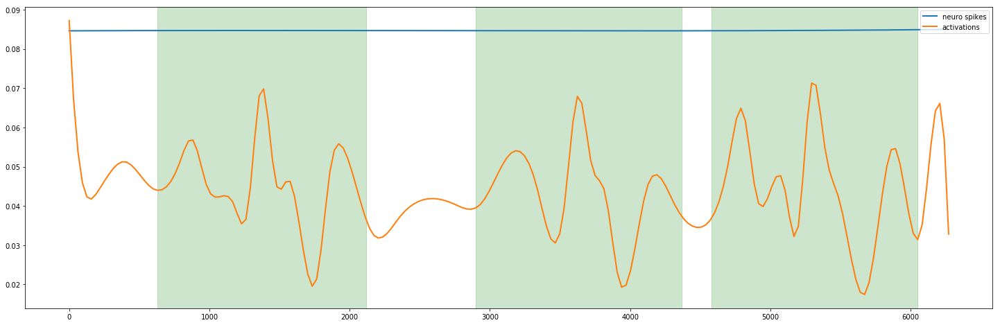


mannwhitneyu test:
Layer 16, activation 16, mw_p 5.260214556662799e-23
Layer 13, activation 42, mw_p 1.0976072488574753e-19
Layer 16, activation 114, mw_p 2.2425016768409596e-19
Layer 12, activation 42, mw_p 1.8607800106781544e-18
Layer 4, activation 13, mw_p 9.88013750011976e-18
Layer 14, activation 17, mw_p 5.495189062775561e-17
Layer 15, activation 17, mw_p 9.331915698103041e-17
Layer 17, activation 56, mw_p 2.1364867465338074e-15
Layer 16, activation 56, mw_p 5.582548678624708e-15
Layer 16, activation 32, mw_p 7.746702670631365e-15


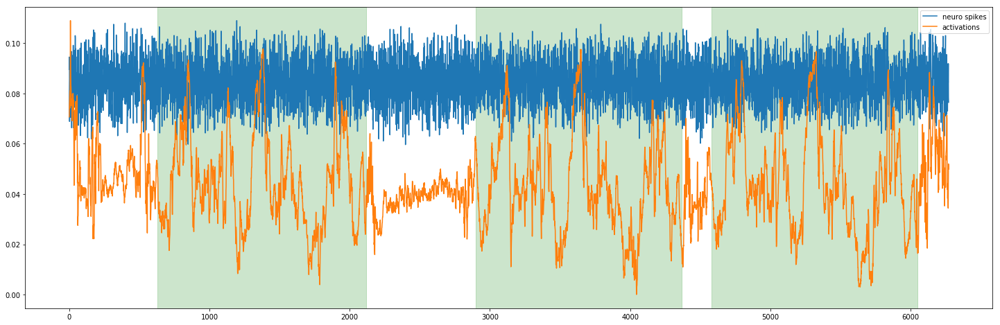

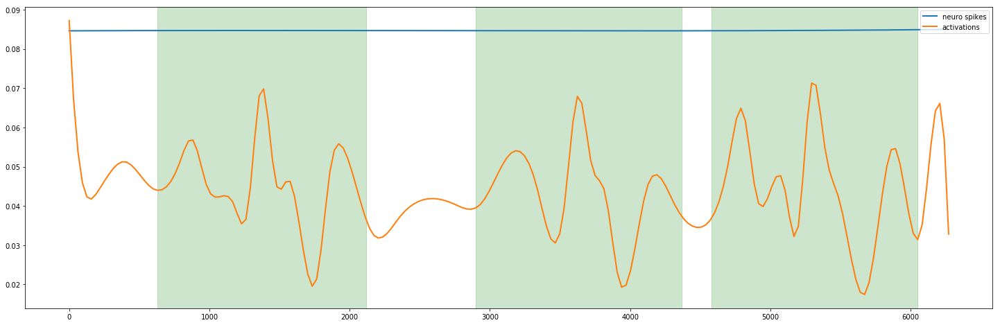

In [ ]:
activations = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.mean_abs)
evaluate(activations, neuro_data)

__mean()__

Global correlation:


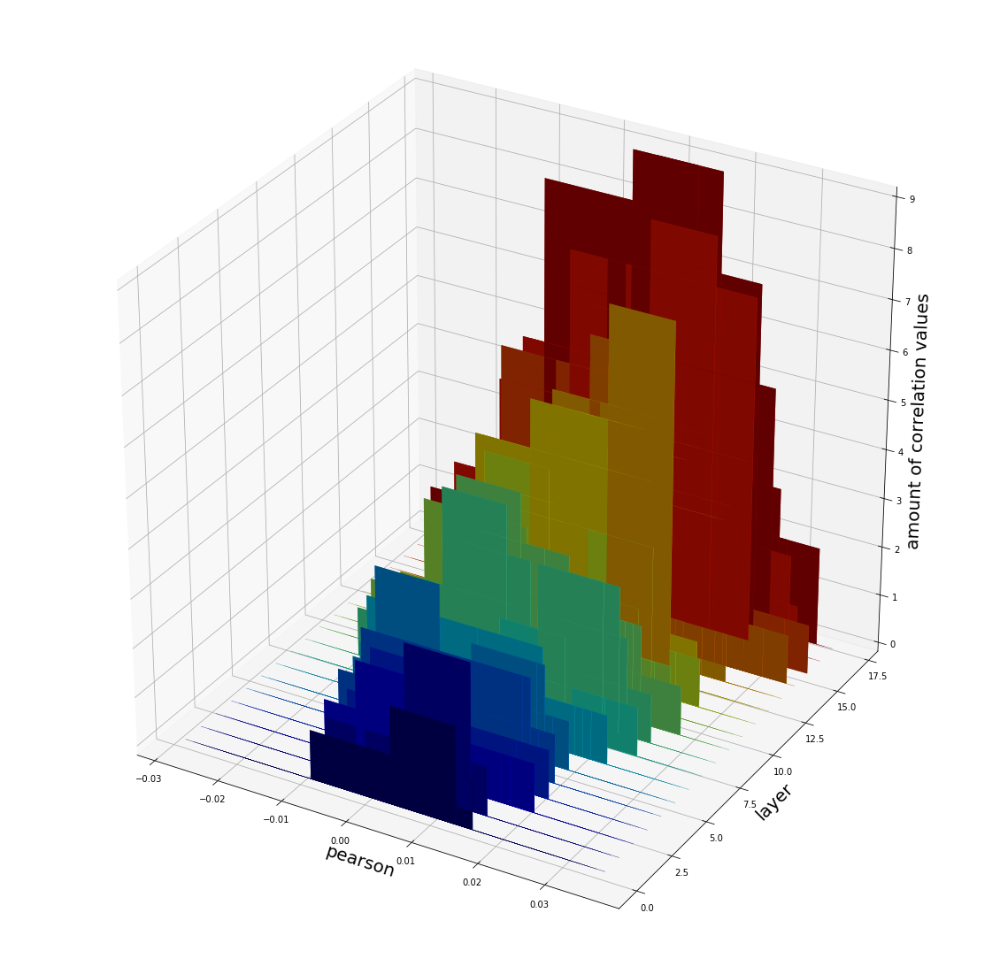

Correlation per round:


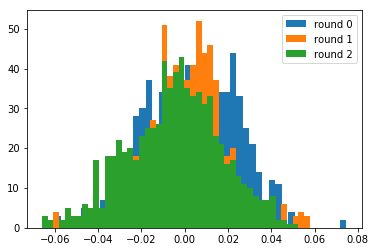

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17KS test:
Layer 6, activation 13, ks_p 1.7427522054866403e-26
Layer 7, activation 9, ks_p 1.8793969417260987e-22
Layer 7, activation 13, ks_p 7.935698640109169e-22
Layer 12, activation 48, ks_p 2.851855878079586e-20
Layer 10, activation 16, ks_p 8.85413776980246e-20
Layer 6, activation 9, ks_p 3.16990193286096e-18
Layer 13, activation 48, ks_p 3.608258532182362e-16
Layer 10, activation 9, ks_p 5.514523387047076e-16
Layer 12, activation 25, ks_p 3.3306690738754696e-15
Layer 11, activation 9, ks_p 8.326672684688674e-15


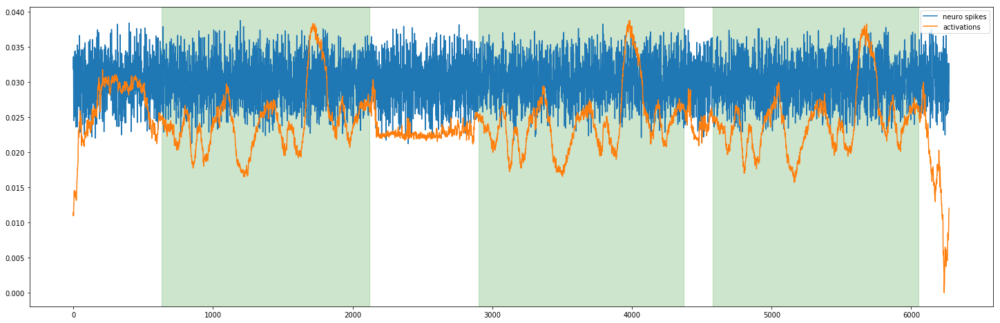

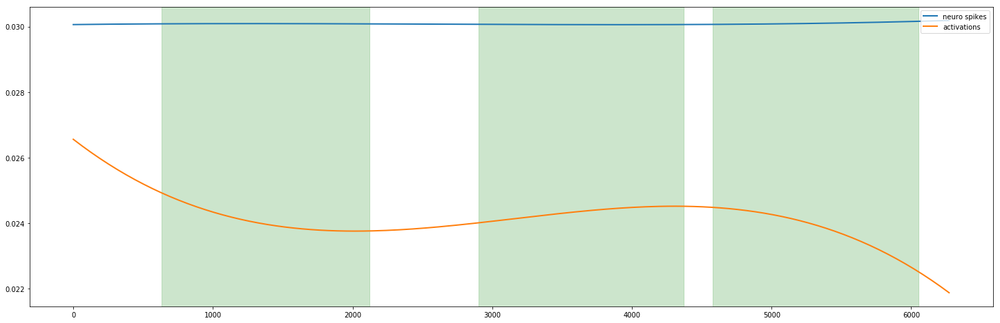


mannwhitneyu test:
Layer 6, activation 13, mw_p 3.9352993360035343e-35
Layer 12, activation 48, mw_p 2.8228097025762743e-32
Layer 7, activation 9, mw_p 1.544733112123939e-31
Layer 7, activation 13, mw_p 1.1299898111426326e-29
Layer 13, activation 48, mw_p 1.862690497166348e-25
Layer 10, activation 9, mw_p 1.2763621009988038e-22
Layer 10, activation 16, mw_p 1.9089533841473488e-21
Layer 12, activation 43, mw_p 4.072205880926243e-21
Layer 11, activation 9, mw_p 1.809415781890995e-19
Layer 12, activation 25, mw_p 3.686462539538856e-18


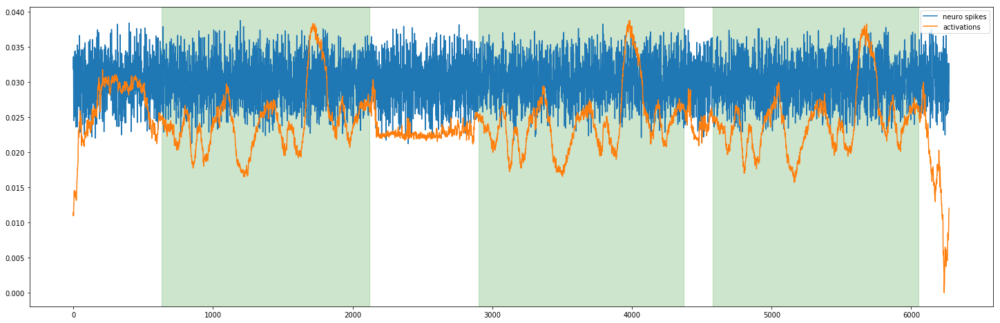

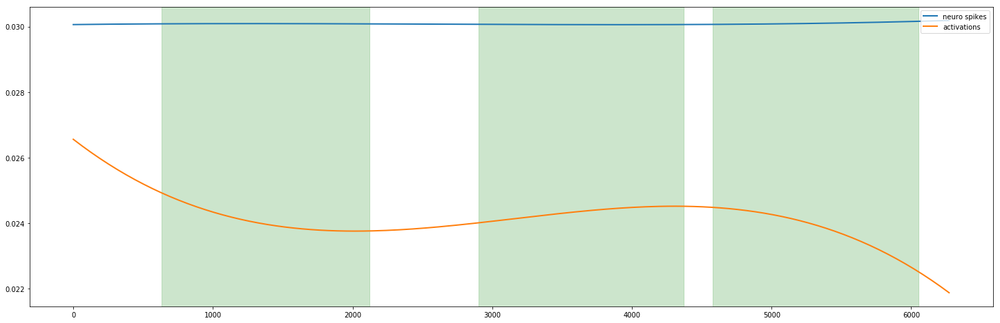

In [ ]:
activations = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.mean)
evaluate(activations, neuro_data)

# Correlations with only yaw rotations

__The copter's flight in the virtual 3D model was rendered again in bee views. However, the pitch angle was fixed. It is examined if fitting correlations with the spike rate are now located on other visual parts than the horizon.__

In [ ]:
bee_view_yaw_only_image_path = Utils.get_path(["flights", "flight_2018_09_03#1", "bee_eye_yaw_only"])

model_loader = ModelLoader(Autoencoder, model_path, bee_view_yaw_only_image_path, batch_size = batch_size,
                           image_height = h, image_width = w)

## Correlation with spike rate

Global correlation:


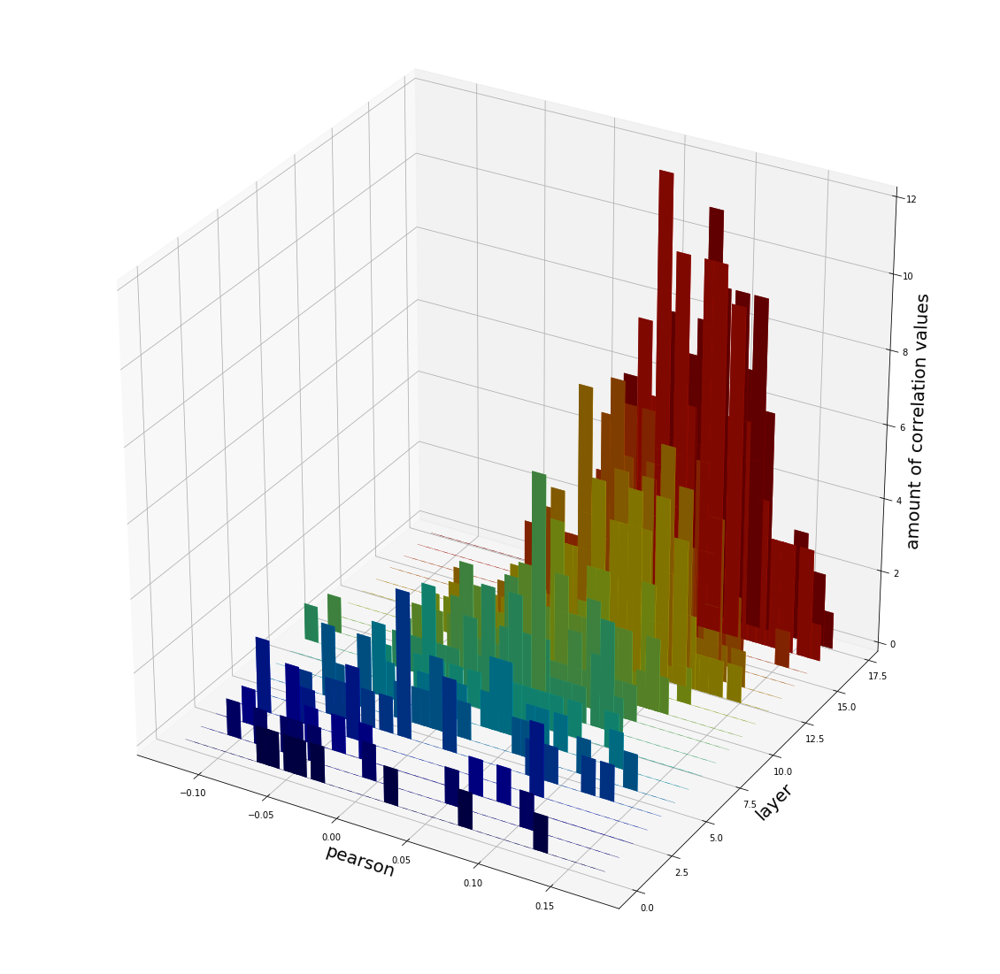

Correlation per round:


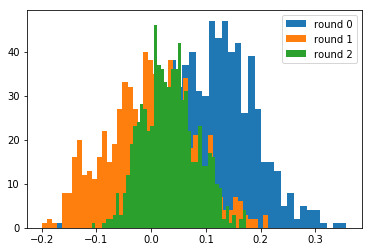

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17KS test:
Layer 14, activation 18, ks_p 7.92486927438338e-37
Layer 15, activation 18, ks_p 1.5476613115023577e-32
Layer 14, activation 19, ks_p 4.0809246464618707e-25
Layer 13, activation 23, ks_p 1.3075891048579148e-24
Layer 8, activation 20, ks_p 1.7761224518300058e-23
Layer 9, activation 20, ks_p 5.310186484919505e-23
Layer 16, activation 19, ks_p 1.431599380004779e-22
Layer 17, activation 61, ks_p 1.670879404407561e-22
Layer 16, activation 61, ks_p 5.881395453448324e-21
Layer 15, activation 4, ks_p 1.812933543983113e-19


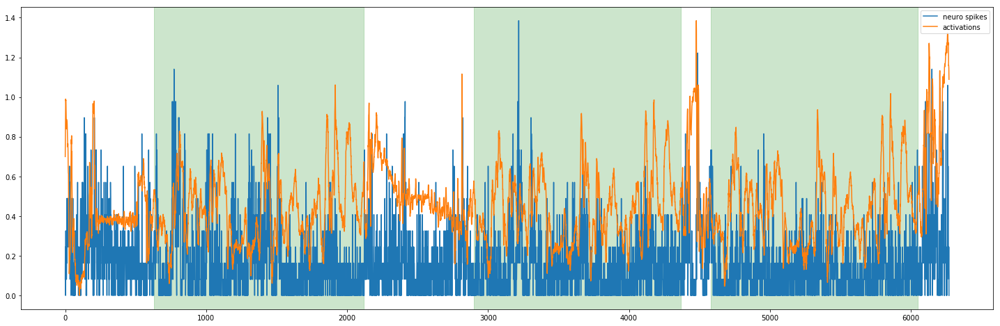

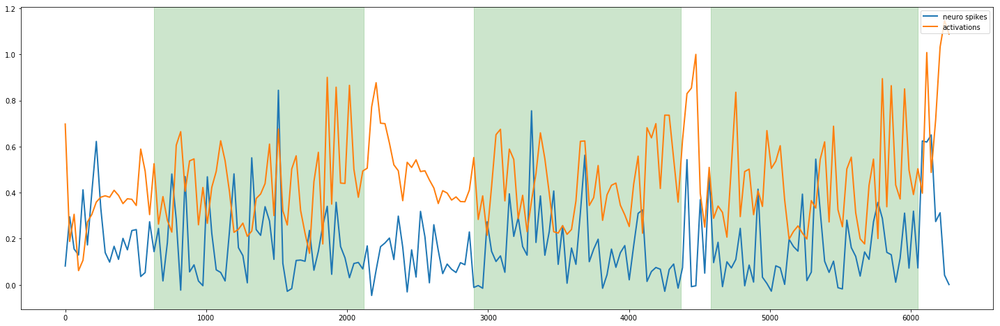


mannwhitneyu test:
Layer 14, activation 18, mw_p 5.476412245554641e-50
Layer 15, activation 18, mw_p 1.750165995893755e-39
Layer 9, activation 20, mw_p 8.325610869119067e-37
Layer 14, activation 19, mw_p 7.7146632955649e-33
Layer 8, activation 20, mw_p 1.3254813154461708e-31
Layer 17, activation 61, mw_p 1.117819037112599e-30
Layer 16, activation 61, mw_p 1.658978277844733e-30
Layer 16, activation 19, mw_p 1.713798242633715e-29
Layer 13, activation 23, mw_p 1.384649678003945e-26
Layer 16, activation 93, mw_p 7.918071129773088e-23


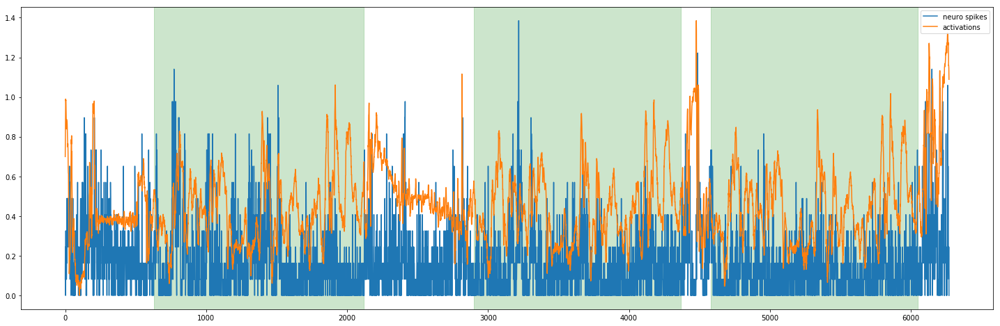

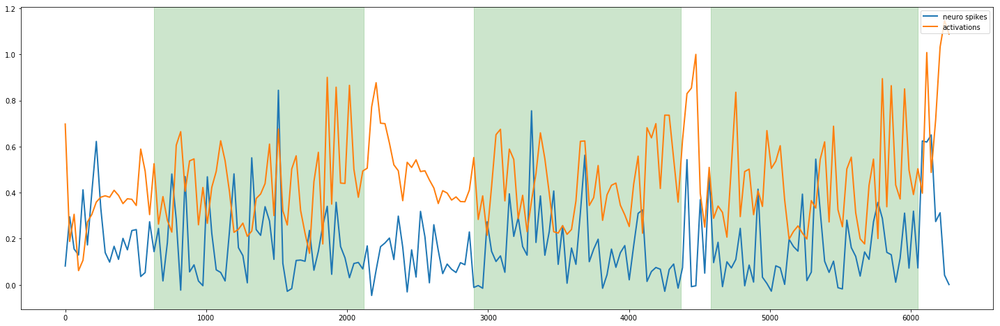

In [ ]:
activations = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.sum_abs)

evaluate(activations, neuro_spikes)

## Correlation with derived spike rate

In [ ]:
neuro_spikes_prime = get_derived_neuro_spikes()

Global correlation:


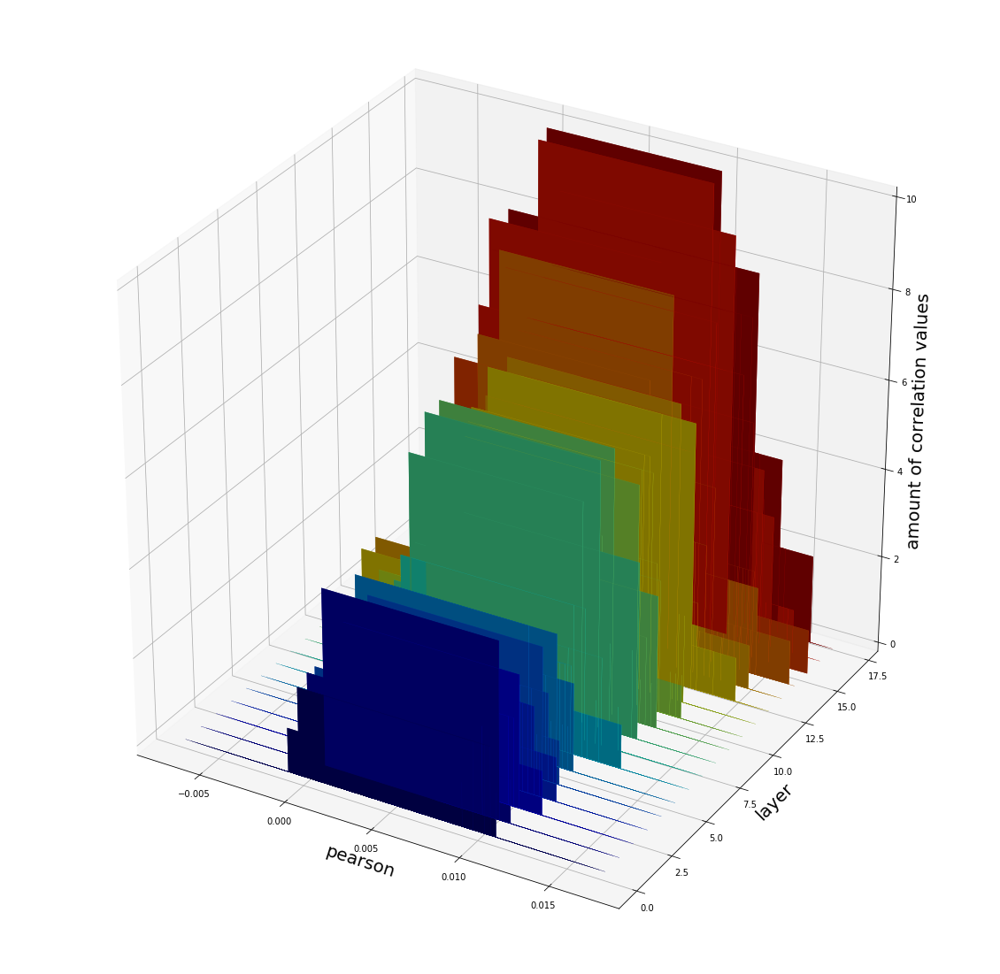

Correlation per round:


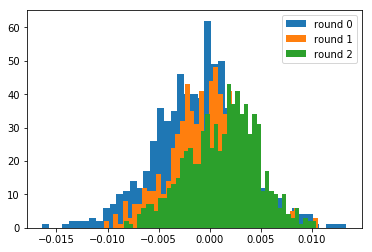

entry_count:  736 , windows:  74 , window_size:  20
Layer finished : 17KS test:
Layer 14, activation 7, ks_p 1.8720281673264628e-23
Layer 15, activation 7, ks_p 6.573569772729342e-19
Layer 12, activation 6, ks_p 2.152195406219688e-18
Layer 6, activation 4, ks_p 1.9251267247000214e-12
Layer 17, activation 73, ks_p 7.149170144771233e-12
Layer 11, activation 21, ks_p 3.6194602870409653e-11
Layer 10, activation 21, ks_p 4.759526106568046e-11
Layer 7, activation 9, ks_p 5.640043987398258e-11
Layer 13, activation 6, ks_p 5.654543500099862e-11
Layer 17, activation 64, ks_p 7.569977977794906e-11


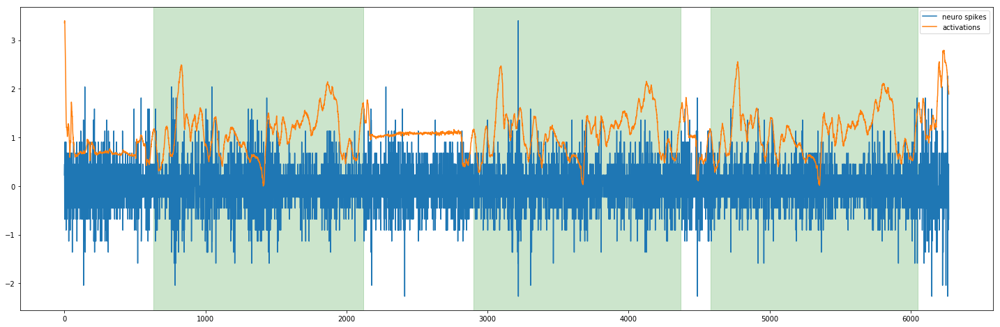

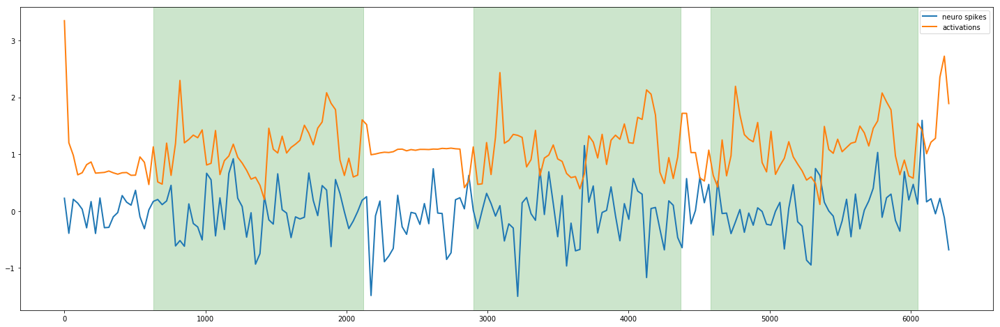


mannwhitneyu test:
Layer 14, activation 7, mw_p 1.774482409601181e-29
Layer 15, activation 7, mw_p 3.1759944952091837e-25
Layer 12, activation 6, mw_p 3.35447630258918e-20
Layer 17, activation 73, mw_p 1.0785024801612578e-17
Layer 6, activation 4, mw_p 3.49821447897064e-16
Layer 13, activation 6, mw_p 1.3646082879759728e-15
Layer 16, activation 21, mw_p 2.0392529274565768e-15
Layer 7, activation 9, mw_p 2.7431499312010108e-15
Layer 16, activation 73, mw_p 1.2750361413120324e-14
Layer 17, activation 21, mw_p 2.0437359618274813e-14


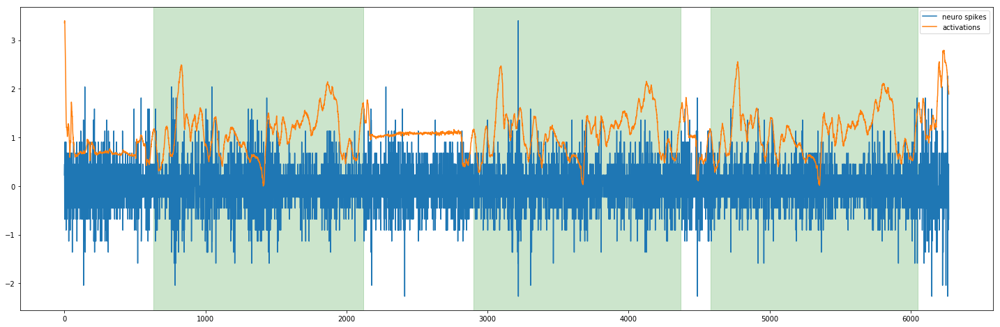

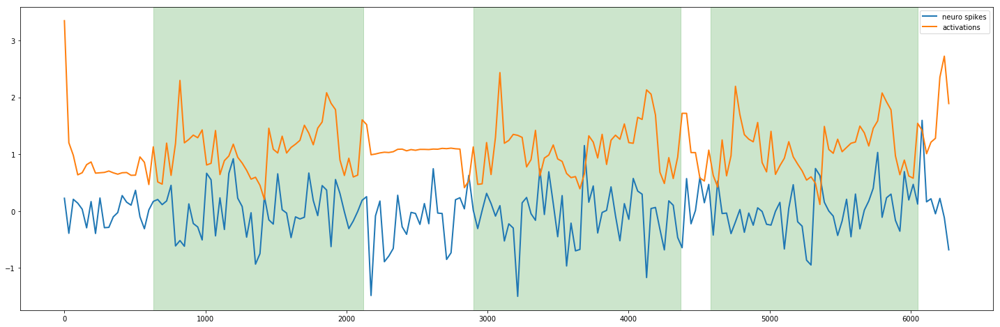

In [ ]:
activations = DataLoader.load_filter_activations(model_loader, DataLoader.ACTIVATION_FUNCTION.sum_abs)

evaluate(activations, neuro_spikes_prime)